# Twitter Data Cleaning and Preprocessing

In [1]:
!pip install tweet-preprocessor

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 

import preprocessor as p
import re
import html

In [3]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to C:\Users\Zi
[nltk_data]     Ying\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\Zi
[nltk_data]     Ying\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

# Cleaning Twitter Data

In [4]:
tweets_df = pd.read_csv('data/tweets.csv')
tweets_df.head()

,date,tweet_id,text,year
0,2021-02-04 02:18:30+00:00,1357151516428099587,is nars blush any good? sunnies face blush doe...,2021
1,2021-02-03 18:48:46+00:00,1357038337396142081,Lmfaoooooooo “can I sample deep throat” 😒😂 I f...,2021
2,2021-02-03 14:41:58+00:00,1356976226431197184,ㅤㅤ \nCategory is face and I won. \n\nPictorial...,2021
3,2021-02-03 14:36:55+00:00,1356974955666284546,Have you heard about the NARS orgasm blush? ht...,2021
4,2021-02-03 02:19:32+00:00,1356789387451789312,020221 : ELLE KOREA - LEEHI X NARS 'Dear. Darl...,2021


In [5]:
tweets_08_13 = tweets_df[tweets_df['year'] <=2013].copy()
tweets_08_13

,date,tweet_id,text,year
27440,2013-12-31 17:51:39+00:00,418077002650763264,"#1: NARS Blush, Orgasm 0.16 oz.: NARS Blush, O...",2013
27441,2013-12-31 17:50:51+00:00,418076801278029824,"#4: NARS Blush, Orgasm 0.16 oz.: NARS Blush, O...",2013
27442,2013-12-31 17:48:11+00:00,418076130097512449,@adriecam the fact that the blush we just purc...,2013
27443,2013-12-31 17:29:49+00:00,418071507248898049,"Todays buys #realtechniques blush brush, #slee...",2013
27444,2013-12-31 16:34:16+00:00,418057528019533825,#cosmetics #makeup - NARS ORGASM Blush &amp; ...,2013
27445,2013-12-31 16:13:37+00:00,418052332220186624,"Mega Great NARS Blush, Orgasm 0.16 oz. http://...",2013
27446,2013-12-31 15:32:46+00:00,418042052203782144,"Was going to buy the Nars Orgasm blush, then f...",2013
27447,2013-12-31 15:23:49+00:00,418039798251548672,@NARSissist nars powder blush made top of our...,2013
27448,2013-12-31 11:22:26+00:00,417979054604558337,"#2: NARS Blush, Orgasm 0.16 oz.: NARS Blush, O...",2013
27449,2013-12-31 11:21:46+00:00,417978883032379392,"#1: NARS Blush, Orgasm 0.16 oz.: NARS Blush, O...",2013


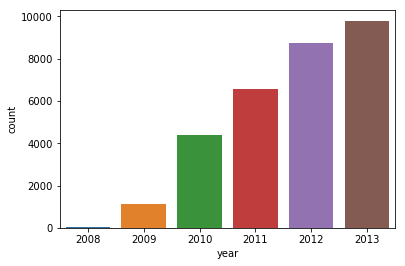

In [6]:
sns.countplot(x = 'year', data = tweets_08_13)

In [7]:
print(tweets_08_13[tweets_08_13['year'] == 2008].shape[0])
print(tweets_08_13[tweets_08_13['year'] == 2009].shape[0])
print(tweets_08_13[tweets_08_13['year'] == 2010].shape[0])
print(tweets_08_13[tweets_08_13['year'] == 2011].shape[0])
print(tweets_08_13[tweets_08_13['year'] == 2012].shape[0])
print(tweets_08_13[tweets_08_13['year'] == 2013].shape[0])

57
1107
4391
6548
8764
9795


(-0.5, 699.5, 399.5, -0.5)

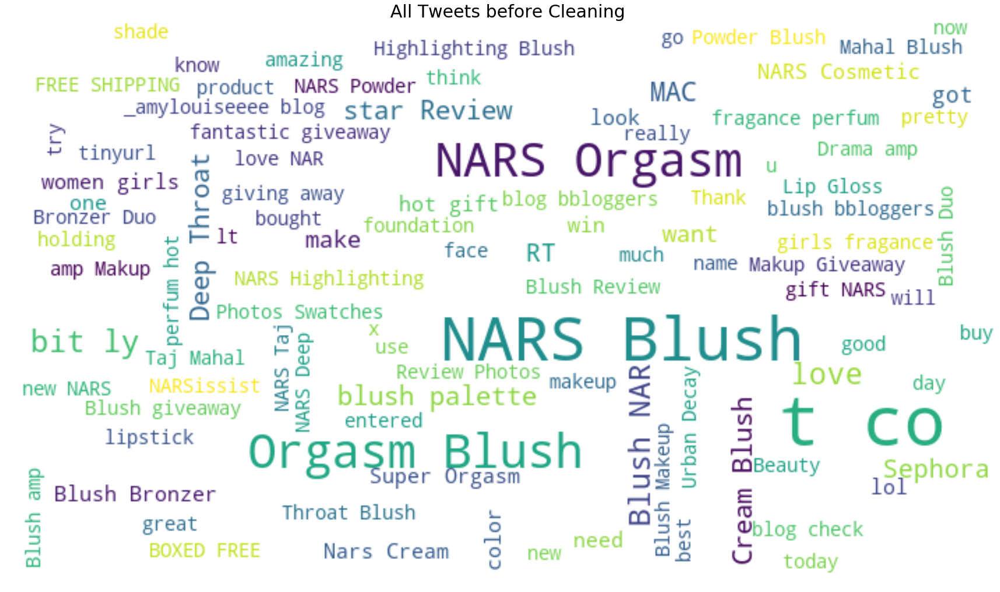

In [8]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in tweets_08_13.text)

plt.figure(figsize  = (30,30))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, width = 700, height = 400, 
                background_color ='white',min_font_size = 12).generate(tweet_All)

# Display the generated image:
plt.imshow(wordcloud_ALL, interpolation='bilinear')
plt.title('All Tweets before Cleaning', fontsize=30)
plt.axis('off')


In [9]:
pd.set_option('max_rows', 99999)
pd.set_option('max_colwidth', 400)

Most common words are NARS/Nars blush/Blush and stopwords. Notably, Orgasm is one of the most mentioned products in the tweets

In [10]:
tweets_08_13['tweets_lower'] = tweets_08_13['text'].apply(lambda x : x.lower())

In [11]:
# Top 20 Words
pd.Series(' '.join(tweets_08_13['tweets_lower']).split()).value_counts()[:20]

nars      28700
blush     23557
i         10069
orgasm     8673
a          8545
the        8085
and        6413
my         5060
in         4818
is         4661
to         4659
for        4446
on         4070
of         3377
-          3314
it         2626
love       2499
you        2155
blush,     2130
have       2080
dtype: int64

In [12]:
#make an copy of the actual dataset
tweets_copy = tweets_08_13.copy()
tweets_copy.shape[0]

30662

In [13]:
#find number of words in the tweet
tweets_copy['tweet length'] = tweets_copy['text'].apply(lambda x: len(x.split()))
tweets_copy.head()

,date,tweet_id,text,year,tweets_lower,tweet length
27440,2013-12-31 17:51:39+00:00,418077002650763264,"#1: NARS Blush, Orgasm 0.16 oz.: NARS Blush, Orgasm 0.16 oz. NARS (273)Buy new: $29.00 (Visit the Best Selle... http://t.co/ppu0afz6yJ",2013,"#1: nars blush, orgasm 0.16 oz.: nars blush, orgasm 0.16 oz. nars (273)buy new: $29.00 (visit the best selle... http://t.co/ppu0afz6yj",20
27441,2013-12-31 17:50:51+00:00,418076801278029824,"#4: NARS Blush, Orgasm 0.16 oz.: NARS Blush, Orgasm 0.16 oz. NARS (273)Buy new: $29.00 (Visit the Best Selle... http://t.co/Ad3xn6gP0l",2013,"#4: nars blush, orgasm 0.16 oz.: nars blush, orgasm 0.16 oz. nars (273)buy new: $29.00 (visit the best selle... http://t.co/ad3xn6gp0l",20
27442,2013-12-31 17:48:11+00:00,418076130097512449,@adriecam the fact that the blush we just purchased is Orgasm and Deep Throat....? #nars,2013,@adriecam the fact that the blush we just purchased is orgasm and deep throat....? #nars,15
27443,2013-12-31 17:29:49+00:00,418071507248898049,"Todays buys #realtechniques blush brush, #sleek contour kit, #nars #sheerglow #foundation mont blanc,… http://t.co/wJWkfQkkap",2013,"todays buys #realtechniques blush brush, #sleek contour kit, #nars #sheerglow #foundation mont blanc,… http://t.co/wjwkfqkkap",14
27444,2013-12-31 16:34:16+00:00,418057528019533825,#cosmetics #makeup - NARS ORGASM Blush &amp; LAGUNA Bronzer 0.16oz DUO Brand New (Travel Size) http://t.co/UiWZo04QKN,2013,#cosmetics #makeup - nars orgasm blush &amp; laguna bronzer 0.16oz duo brand new (travel size) http://t.co/uiwzo04qkn,16


In [14]:
#Already scrapping tweets containing both nars and blush
#so tweets with fewer than 2 words will not have any sentiment to capture 
tweets_copy[tweets_copy['tweet length'] <= 2]

,date,tweet_id,text,year,tweets_lower,tweet length
32408,2013-06-04 19:28:37+00:00,341999954132365313,nars-blush-orgasm.… http://t.co/m3cEqiulWq,2013,nars-blush-orgasm.… http://t.co/m3ceqiulwq,2
33933,2013-04-14 21:14:02+00:00,323544699694612481,#nars#spoiled#makeup#blush#angelika#sephora#france#summer#avignon#fave#shoping#centre#shop#cute#girlypi… http://t.co/tTlFXBpiXs,2013,#nars#spoiled#makeup#blush#angelika#sephora#france#summer#avignon#fave#shoping#centre#shop#cute#girlypi… http://t.co/ttlfxbpixs,2
37200,2013-01-02 21:24:16+00:00,286583712777392128,Nars blush&gt;&gt;&gt;&gt;&gt;,2013,nars blush&gt;&gt;&gt;&gt;&gt;,2
45736,2012-01-09 00:43:31+00:00,156174223818227713,NARS blush&gt;&gt;&gt;,2012,nars blush&gt;&gt;&gt;,2
48853,2011-08-08 07:13:25+00:00,100464616794112000,NARS Blush&gt;&gt;&gt;&gt;&gt;&gt;,2011,nars blush&gt;&gt;&gt;&gt;&gt;&gt;,2
56128,2010-03-10 22:12:20+00:00,10291349086,Blush nars...,2010,blush nars...,2


In [15]:
tweets_copy[tweets_copy['tweet length'] <= 2].shape[0]

6

In [16]:
#remove these tweets with only 2 words nars and blush
tweets_copy.drop(tweets_copy[tweets_copy['tweet length']<=2].index, inplace = True)

# Remove tweets related to giveaway

In [17]:
tweets_giveaway = tweets_copy[tweets_copy['tweets_lower'].str.contains("giveaway")]
tweets_giveaway.head()

,date,tweet_id,text,year,tweets_lower,tweet length
27616,2013-12-19 17:54:26+00:00,413729050356494336,Christmas Giveaway 2013: NARS Guy Bourdin Blush Palette! xo http://t.co/gxGtqBpcF8,2013,christmas giveaway 2013: nars guy bourdin blush palette! xo http://t.co/gxgtqbpcf8,10
27627,2013-12-18 22:03:37+00:00,413429370246529024,I've entered @HarleanRose thankyou giveaway for a LE Nars Blush! #bbloggers #fblchat http://t.co/e8kFsusc5I,2013,i've entered @harleanrose thankyou giveaway for a le nars blush! #bbloggers #fblchat http://t.co/e8kfsusc5i,13
27629,2013-12-18 21:58:48+00:00,413428157283180544,I've entered @HarleanRose thankyou giveaway for a LE Nars Blush! #bbloggers #fblchat http://t.co/BMfxSNWFNl,2013,i've entered @harleanrose thankyou giveaway for a le nars blush! #bbloggers #fblchat http://t.co/bmfxsnwfnl,13
27638,2013-12-18 11:00:41+00:00,413262536780161024,I've entered @HarleanRose thankyou giveaway for a LE Nars Blush! #bbloggers #fblchat http://t.co/CVbCduZ2ct,2013,i've entered @harleanrose thankyou giveaway for a le nars blush! #bbloggers #fblchat http://t.co/cvbcduz2ct,13
27650,2013-12-17 09:03:48+00:00,412870732289290241,I've entered @HarleanRose thankyou giveaway for a LE Nars Blush! #bbloggers #fblchat http://t.co/CVbCduZ2ct,2013,i've entered @harleanrose thankyou giveaway for a le nars blush! #bbloggers #fblchat http://t.co/cvbcduz2ct,13


In [18]:
print(tweets_giveaway.shape[0])
tweets_giveaway.shape[0]/tweets_08_13.shape[0]*100

1975


6.4411975735438

In [19]:
#remove them from the actual dataset
tweets_copy.drop(tweets_copy[tweets_copy['tweets_lower'].str.contains("giveaway")].index, inplace = True)

In [20]:
tweets_copy.shape[0]

28681

In [21]:
30662-1975 #check that the number of rows tally

28687

In [22]:
tweets_08_13.shape[0]-1975

28687

# FOTD MOTD OOTD

In [23]:
tweets_fotd_motd_ootd = tweets_copy[tweets_copy['tweets_lower'].str.contains("motd|fotd|ootd")]
tweets_fotd_motd_ootd.head()

,date,tweet_id,text,year,tweets_lower,tweet length
27672,2013-12-16 12:04:33+00:00,412553832703737856,Photo: &amp; to complete the look #FOTD #Manhattan eyeshadows #blush #NARS deep throat #bronzer #MAC #MSN in... http://t.co/35vXKc4ZQK,2013,photo: &amp; to complete the look #fotd #manhattan eyeshadows #blush #nars deep throat #bronzer #mac #msn in... http://t.co/35vxkc4zqk,18
27673,2013-12-16 12:04:31+00:00,412553823711154176,&amp; to complete the look #FOTD #Manhattan eyeshadows #blush #NARS deep throat #bronzer #MAC #MSN in… http://t.co/r0w0JVhz8g,2013,&amp; to complete the look #fotd #manhattan eyeshadows #blush #nars deep throat #bronzer #mac #msn in… http://t.co/r0w0jvhz8g,17
27674,2013-12-16 10:48:48+00:00,412534772557418496,"FOTD: Laura Mercier Tinted Moisturizer, NARS Laguna, Hourglass Ambient Lighting Powder, YSL Effet Faux Cils, Tom Ford l/s Blush Nude - ihr?",2013,"fotd: laura mercier tinted moisturizer, nars laguna, hourglass ambient lighting powder, ysl effet faux cils, tom ford l/s blush nude - ihr?",22
27707,2013-12-14 16:17:19+00:00,411892667464036353,"Today's #motd #kevynaucoin contouring powder, #makeupforever aqua shadow, #nars blush, #nars… http://t.co/FGs5fOuYnz",2013,"today's #motd #kevynaucoin contouring powder, #makeupforever aqua shadow, #nars blush, #nars… http://t.co/fgs5fouynz",12
27711,2013-12-14 12:42:59+00:00,411838730971123712,Details of today's FOTD:\n1) YSL BB cream in Medium\n2) Shocking Pink blush by Nars\n3) Raisin blush as… http://t.co/El8d6P3Q03,2013,details of today's fotd:\n1) ysl bb cream in medium\n2) shocking pink blush by nars\n3) raisin blush as… http://t.co/el8d6p3q03,21


In [24]:
tweets_fotd_motd_ootd.shape[0]

215

In [25]:
tweets_fotd_motd_ootd.shape[0]/tweets_08_13.shape[0]*100

0.7011936599047681

In [26]:
#Remove these rows from tweets_copy()
tweets_copy.drop(tweets_copy[tweets_copy['tweets_lower'].str.contains("motd|fotd|ootd")].index, inplace = True)

In [27]:
tweets_copy.shape[0]

28466

In [28]:
28687-tweets_copy.shape[0]

221

In [29]:
tweets_copy[tweets_copy['tweets_lower'].str.contains("makeup of the day|face of the day|outfit of the day")].head()

,date,tweet_id,text,year,tweets_lower,tweet length
29173,2013-10-20 02:37:08+00:00,391754929993703425,"Some of my face of the day products! 💄✨ Blush: NARS, Lipstick: Australis, Foundation: Laura Mercier… http://t.co/rt2EGBkUOZ",2013,"some of my face of the day products! 💄✨ blush: nars, lipstick: australis, foundation: laura mercier… http://t.co/rt2egbkuoz",17
29434,2013-10-12 17:39:27+00:00,389082903327834112,"Hair and makeup of the day... makeup forever foundation &amp; concealer, Nars hot pink blush &amp; prestige… http://t.co/NIvp1tuqpO",2013,"hair and makeup of the day... makeup forever foundation &amp; concealer, nars hot pink blush &amp; prestige… http://t.co/nivp1tuqpo",18
30452,2013-08-31 11:19:00+00:00,373766869964324864,Makeup of the day : 30-08-2013 dayout at Metro Centre no eyeshadow / mascara + eyebrow étude house / blush Nars... http://t.co/rvsZsfyYgC,2013,makeup of the day : 30-08-2013 dayout at metro centre no eyeshadow / mascara + eyebrow étude house / blush nars... http://t.co/rvszsfyygc,22
30454,2013-08-31 11:09:06+00:00,373764378681540608,Makeup of the day : 30-08-2013 dayout at Metro Centre no eyeshadow / mascara + eyebrow étude house / blush Nars... http://t.co/zKtAdik9GX,2013,makeup of the day : 30-08-2013 dayout at metro centre no eyeshadow / mascara + eyebrow étude house / blush nars... http://t.co/zktadik9gx,22
33767,2013-04-19 10:11:41+00:00,325189955833974784,Face of the day! Blush cactus flower nars 😍 http://t.co/YpJ8Z7tPK3,2013,face of the day! blush cactus flower nars 😍 http://t.co/ypj8z7tpk3,10


In [30]:
tweets_copy.drop(tweets_copy[tweets_copy['tweets_lower'].str.contains("makeup of the day|face of the day |outfit of the day")].index, inplace = True)

In [31]:
tweets_copy.shape[0]

28448

# Remove Tweets with Whitney Port 

In [32]:
tweets_copy[tweets_copy['text'].str.contains("Whitney Port")].head()

,date,tweet_id,text,year,tweets_lower,tweet length
29826,2013-09-29 14:49:14+00:00,384329023167684608,"“I brush a little bit of NARS Orgasm Blush on my cheekbones, a little on my forehead, nose, and chin to keep it constant” – Whitney Port",2013,"“i brush a little bit of nars orgasm blush on my cheekbones, a little on my forehead, nose, and chin to keep it constant” – whitney port",27
30060,2013-09-18 12:00:59+00:00,380300417651195904,"“I brush a little bit of NARS Orgasm Blush on my cheekbones, a little on my forehead, nose, and chin to keep it constant” – Whitney Port",2013,"“i brush a little bit of nars orgasm blush on my cheekbones, a little on my forehead, nose, and chin to keep it constant” – whitney port",27
30300,2013-09-06 12:19:50+00:00,375956506023591936,"“I brush a little bit of NARS Orgasm Blush on my cheekbones, a little on my forehead, nose, and chin to keep it constant” – Whitney Port",2013,"“i brush a little bit of nars orgasm blush on my cheekbones, a little on my forehead, nose, and chin to keep it constant” – whitney port",27
30326,2013-09-05 17:27:17+00:00,375671490618068992,"“I brush a little bit of NARS Orgasm Blush on my cheekbones, a little on my forehead, nose, and chin to keep it constant” – Whitney Port",2013,"“i brush a little bit of nars orgasm blush on my cheekbones, a little on my forehead, nose, and chin to keep it constant” – whitney port",27
30605,2013-08-23 21:09:06+00:00,371016268096487424,"“I brush a little bit of NARS Orgasm Blush on my cheekbones, a little on my forehead, nose, and chin to keep it constant” – Whitney Port",2013,"“i brush a little bit of nars orgasm blush on my cheekbones, a little on my forehead, nose, and chin to keep it constant” – whitney port",27


In [33]:
tweets_copy[tweets_copy['text'].str.contains("Whitney Port")].shape[0]

32

In [34]:
#remove tweets containing Whitney Port
tweets_copy.drop(tweets_copy[tweets_copy['text'].str.contains("Whitney Port")].index, inplace = True)

In [35]:
tweets_copy.shape[0]

28416

# Containing RT

In [36]:
tweets_copy[tweets_copy['text'].str.contains("RT")].head()

,date,tweet_id,text,year,tweets_lower,tweet length
27451,2013-12-31 06:36:42+00:00,417907144990531584,I die. RT @natratanna: NARS Final Cut Collection Swatches!! \n#nars #swatches #meccamaxima #makeup #narsblush… http://t.co/TJZqXAs5tZ,2013,i die. rt @natratanna: nars final cut collection swatches!! \n#nars #swatches #meccamaxima #makeup #narsblush… http://t.co/tjzqxas5tz,15
27465,2013-12-30 05:51:05+00:00,417533277625282560,I want to go to there. RT @natratanna: NEW #nars #finalcut collection!! It's pretty. #narsblush #satinlippencil… http://t.co/KhcbqC1GBh,2013,i want to go to there. rt @natratanna: new #nars #finalcut collection!! it's pretty. #narsblush #satinlippencil… http://t.co/khcbqc1gbh,17
27508,2013-12-27 19:54:05+00:00,416658260385878017,#2013Faves RT @FancyFour: The things I had to do to get Mark to order me this Nars blush.... 🙈🙈🙊,2013,#2013faves rt @fancyfour: the things i had to do to get mark to order me this nars blush.... 🙈🙈🙊,19
27614,2013-12-20 00:10:18+00:00,413823637712429056,NARS BLUSH DUO * HUNGRY HEART (I) / ORGASM * TRAVEL SIZE .17 oz / 5 g BRAND NEW http://t.co/ecYnOo6Y5X http://t.co/LuCiiXjBKD,2013,nars blush duo * hungry heart (i) / orgasm * travel size .17 oz / 5 g brand new http://t.co/ecynoo6y5x http://t.co/luciixjbkd,21
27899,2013-12-05 05:49:35+00:00,408473204496142336,NARS Cactus Flower. It's outrageous bright I love it. RT @DrnkGrlConfess: What kind of blush do you use??? @QueenSCB,2013,nars cactus flower. it's outrageous bright i love it. rt @drnkgrlconfess: what kind of blush do you use??? @queenscb,19


In [37]:
tweets_copy[tweets_copy['text'].str.contains("RT")].shape[0]

1197

In [38]:
#remove these tweets retweeting
tweets_copy.drop(tweets_copy[tweets_copy['text'].str.contains("RT")].index, inplace = True)

In [39]:
tweets_copy.shape[0]

27219

# Remove Tweets with hyperlinks

In [40]:
tweets_copy[tweets_copy['tweets_lower'].str.contains("http|https|www")].head()

,date,tweet_id,text,year,tweets_lower,tweet length
27440,2013-12-31 17:51:39+00:00,418077002650763264,"#1: NARS Blush, Orgasm 0.16 oz.: NARS Blush, Orgasm 0.16 oz. NARS (273)Buy new: $29.00 (Visit the Best Selle... http://t.co/ppu0afz6yJ",2013,"#1: nars blush, orgasm 0.16 oz.: nars blush, orgasm 0.16 oz. nars (273)buy new: $29.00 (visit the best selle... http://t.co/ppu0afz6yj",20
27441,2013-12-31 17:50:51+00:00,418076801278029824,"#4: NARS Blush, Orgasm 0.16 oz.: NARS Blush, Orgasm 0.16 oz. NARS (273)Buy new: $29.00 (Visit the Best Selle... http://t.co/Ad3xn6gP0l",2013,"#4: nars blush, orgasm 0.16 oz.: nars blush, orgasm 0.16 oz. nars (273)buy new: $29.00 (visit the best selle... http://t.co/ad3xn6gp0l",20
27443,2013-12-31 17:29:49+00:00,418071507248898049,"Todays buys #realtechniques blush brush, #sleek contour kit, #nars #sheerglow #foundation mont blanc,… http://t.co/wJWkfQkkap",2013,"todays buys #realtechniques blush brush, #sleek contour kit, #nars #sheerglow #foundation mont blanc,… http://t.co/wjwkfqkkap",14
27444,2013-12-31 16:34:16+00:00,418057528019533825,#cosmetics #makeup - NARS ORGASM Blush &amp; LAGUNA Bronzer 0.16oz DUO Brand New (Travel Size) http://t.co/UiWZo04QKN,2013,#cosmetics #makeup - nars orgasm blush &amp; laguna bronzer 0.16oz duo brand new (travel size) http://t.co/uiwzo04qkn,16
27445,2013-12-31 16:13:37+00:00,418052332220186624,"Mega Great NARS Blush, Orgasm 0.16 oz. http://t.co/fUuDfO135r",2013,"mega great nars blush, orgasm 0.16 oz. http://t.co/fuudfo135r",8


In [41]:
tweets_copy[tweets_copy['tweets_lower'].str.contains("http|https|www")].shape[0]

15451

In [42]:
#remove tweets with links in it
tweets_copy.drop(tweets_copy[tweets_copy['tweets_lower'].str.contains("http|https|www")].index, inplace = True)

In [43]:
tweets_copy.shape[0]

11768

In [44]:
#the preprocessor will remove url, emoji and mentions
#this is to distill only the text of the tweet for checking of certain characteristics later
#and not used to calculate sentiment
p.set_options(p.OPT.URL, p.OPT.EMOJI, p.OPT.MENTION) 

In [45]:
tweets_copy.columns

Index(['date', 'tweet_id', 'text', 'year', 'tweets_lower', 'tweet length'], dtype='object')

In [46]:
#Remove stopwords
from nltk.corpus import stopwords
stop = stopwords.words('english')
newStopWords = ['nars','blush']
stop.extend(newStopWords)

tweets_copy['tweets_processed'] = tweets_copy['tweets_lower'].apply(lambda x: p.clean(" ".join(x for x in x.split() if x not in stop)))
tweets_copy.head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
27442,2013-12-31 17:48:11+00:00,418076130097512449,@adriecam the fact that the blush we just purchased is Orgasm and Deep Throat....? #nars,2013,@adriecam the fact that the blush we just purchased is orgasm and deep throat....? #nars,15,fact purchased orgasm deep throat....? #nars
27446,2013-12-31 15:32:46+00:00,418042052203782144,"Was going to buy the Nars Orgasm blush, then found out the perfect dupe is the rose gold blush in my sleek face contour kit 😃",2013,"was going to buy the nars orgasm blush, then found out the perfect dupe is the rose gold blush in my sleek face contour kit 😃",26,"going buy orgasm blush, found perfect dupe rose gold sleek face contour kit"
27450,2013-12-31 08:24:15+00:00,417934211967111168,@totallywiggin orgasm is a really good blush by nars if im not mistaken. dont ask how I know it but it is. deepthroat too btw. #imnotagirl,2013,@totallywiggin orgasm is a really good blush by nars if im not mistaken. dont ask how i know it but it is. deepthroat too btw. #imnotagirl,26,orgasm really good im mistaken. dont ask know is. deepthroat btw. #imnotagirl
27454,2013-12-31 03:19:01+00:00,417857396275679233,🐞🐠 my rowboat😍 I love you and think of you everytime I apply my nars blush stick,2013,🐞🐠 my rowboat😍 i love you and think of you everytime i apply my nars blush stick,17,rowboat love think everytime apply stick
27456,2013-12-31 00:50:49+00:00,417820099857235969,Is it weird that my dog wants to lick my @nars_cosmetics blush stick every time I open it?! #obsessed,2013,is it weird that my dog wants to lick my @nars_cosmetics blush stick every time i open it?! #obsessed,19,weird dog wants lick stick every time open it?! #obsessed


# Yearly characteristics related to purchase and product info

In [47]:
#check frequency of words in each year in the tweets with removed stopwords, removed mentions and removed url processed tweets
tweets_08 = tweets_copy[tweets_copy['year'] == 2008].copy()
tweets_09 = tweets_copy[tweets_copy['year'] == 2009].copy()
tweets_10 = tweets_copy[tweets_copy['year'] == 2010].copy()
tweets_11 = tweets_copy[tweets_copy['year'] == 2011].copy()
tweets_12 = tweets_copy[tweets_copy['year'] == 2012].copy()
tweets_13 = tweets_copy[tweets_copy['year'] == 2013].copy()

In [48]:
tweets_08.shape[0]

31

In [49]:
tweets_09.shape[0]

807

In [50]:
tweets_10.shape[0]

2215

In [51]:
tweets_11.shape[0]

3504

In [52]:
tweets_12.shape[0]

2868

In [53]:
tweets_13.shape[0]

2343

# 2008 tweets

In [54]:
#find top 20 words
pd.Series(' '.join(tweets_08['tweets_processed']).split()).value_counts()[:20]

orgasm    13
blush.     7
new        4
-          3
oh         3
want       3
i'm        3
check      3
shadow     2
lash       2
lola       2
&          2
lol        2
know       2
think      2
blush!     2
blush?     2
get        2
using      2
love       2
dtype: int64

In [55]:
#since 2008 only got 31 tweets, do manual deletion to check 32 rows
tweets_08

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
58045,2008-12-31 17:43:04+00:00,1088403492,"? for those who love Nars Orgasm blush - is it the shimmer, the gold, or the sheerness that makes it so special?",2008,"? for those who love nars orgasm blush - is it the shimmer, the gold, or the sheerness that makes it so special?",23,"? love orgasm - shimmer, gold, sheerness makes special?"
58046,2008-12-31 17:22:11+00:00,1088364235,"@TheMakeupGirl FYI: typo on ""the"" on Nars blush. I made @ShannonNelson's 2008 list; goal is to make your 2009, LOL",2008,"@themakeupgirl fyi: typo on ""the"" on nars blush. i made @shannonnelson's 2008 list; goal is to make your 2009, lol",20,"fyi: typo ""the"" blush. made 's 2008 list; goal make 2009, lol"
58047,2008-12-30 16:58:39+00:00,1086183982,OK I need some help. I want to invest in some NARS products but I don't know where to start. Any suggestions other than Orgasm blush?,2008,ok i need some help. i want to invest in some nars products but i don't know where to start. any suggestions other than orgasm blush?,26,ok need help. want invest products know start. suggestions orgasm blush?
58048,2008-12-30 01:43:34+00:00,1085064058,Wants to get NARS orgasm blush :),2008,wants to get nars orgasm blush :),7,wants get orgasm :)
58049,2008-12-22 01:05:33+00:00,1071394691,"@carbfanboy yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!",2008,"@carbfanboy yay! aveda, smashbox, and stila are on the list. my blush is from nars...not on the list :( no more nars!",22,"yay! aveda, smashbox, stila list. nars...not list :( nars!"
58053,2008-12-10 00:56:17+00:00,1048224824,@lollipop26 Lola Lola - so excited. I've been dying to try something from Nars. Maybe a blush next?,2008,@lollipop26 lola lola - so excited. i've been dying to try something from nars. maybe a blush next?,18,lola lola - excited. i've dying try something nars. maybe next?
58058,2008-12-03 04:46:55+00:00,1035593499,"I know when I go to Sephora to ask for Orgasm (a blush by NARS), I will giggle. God help me if I decide I want Super Orgasm.",2008,"i know when i go to sephora to ask for orgasm (a blush by nars), i will giggle. god help me if i decide i want super orgasm.",28,"know go sephora ask orgasm (a nars), giggle. god help decide want super orgasm."
58059,2008-11-30 08:15:56+00:00,1030483036,"really liking the nars powder and blush so far, no break out",2008,"really liking the nars powder and blush so far, no break out",12,"really liking powder far, break"
58060,2008-11-29 06:36:49+00:00,1029080812,Bought the Dior palette & a nars blush! Ugh my self control sucks!! Haha 10% cash back on ebates!!,2008,bought the dior palette & a nars blush! ugh my self control sucks!! haha 10% cash back on ebates!!,19,bought dior palette & blush! ugh self control sucks!! haha 10% cash back ebates!!
58061,2008-11-26 17:13:38+00:00,1024856953,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,2008,hey ladies..why do i all of a sudden have a lemming fo nars taj mahal blush? help me ! lol,20,hey ladies..why sudden lemming fo taj mahal blush? help ! lol


In [56]:
rows_to_drop = [58045, 58046, 58047, 58053, 58058, 58060, 58066, 58096, 58087, 58097, 58100, 58101]
tweets_08 = tweets_08.drop(rows_to_drop)

In [57]:
tweets_08.shape[0]

19

# 2009 tweets

In [58]:
#find top 20 words
pd.Series(' '.join(tweets_09['tweets_processed']).split()).value_counts()[:20]

orgasm           221
want             143
dear             120
#sephoraclaus    114
,                112
year             107
holidays         105
&                 91
blush.            90
love              87
mac               70
like              66
blush,            65
i'm               52
got               50
get               43
new               43
:)                42
sephora           42
duo               39
dtype: int64

In [59]:
#look into tweets with sephoraclaus
tweets_09[tweets_09['tweets_processed'].str.contains("#sephoraclaus")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
57041,2009-12-18 20:26:10+00:00,6807312514,"(@missboss82) Dear @Sephora, All I want for the holidays is Nars Albatross blush. #sephoraclaus",2009,"(@missboss82) dear @sephora, all i want for the holidays is nars albatross blush. #sephoraclaus",14,"() dear , want holidays albatross blush. #sephoraclaus"
57042,2009-12-18 20:25:31+00:00,6807296007,"Dear @Sephora, All I want for the holidays is Nars Albatross blush. #sephoraclaus",2009,"dear @sephora, all i want for the holidays is nars albatross blush. #sephoraclaus",13,"dear , want holidays albatross blush. #sephoraclaus"
57046,2009-12-18 17:03:58+00:00,6801866664,Dear @sephora I'd like NARS blush in lovejoy #sephoraclause,2009,dear @sephora i'd like nars blush in lovejoy #sephoraclause,9,dear i'd like lovejoy #sephoraclause
57047,2009-12-18 15:55:07+00:00,6799839297,"Dear @Sephora, All I want for Christmas is the NARS Orgasm Blush &lt;33 . Pretty Please #SephoraClaus",2009,"dear @sephora, all i want for christmas is the nars orgasm blush &lt;33 . pretty please #sephoraclaus",17,"dear , want christmas orgasm &lt;33 . pretty please #sephoraclaus"
57054,2009-12-18 01:19:20+00:00,6781223488,"Dear @Sephora, All I want for the holidays this year is NARS Blush-Bronzer Duo in Orgasm/Laguna. #SephoraClaus",2009,"dear @sephora, all i want for the holidays this year is nars blush-bronzer duo in orgasm/laguna. #sephoraclaus",17,"dear , want holidays year blush-bronzer duo orgasm/laguna. #sephoraclaus"


In [60]:
#remove all the above, a lot of them joining the sephoraclaus event
tweets_09.drop(tweets_09[tweets_09['tweets_processed'].str.contains("#sephoraclaus")].index, inplace=True)

In [61]:
#"go" and "get" appear in tweets that are mainly talking about what they want to buy/have bought/received
tweets_09[tweets_09['tweets_processed'].str.contains("got|get")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
56944,2009-12-31 04:18:38+00:00,7221496690,@lolitariot Arn got me Nars blush in Orgasm :) My fave blush!!!,2009,@lolitariot arn got me nars blush in orgasm :) my fave blush!!!,12,arn got orgasm :) fave blush!!!
56966,2009-12-29 22:01:22+00:00,7173306449,Got a cute skirt a pair of pants and nars orgasm blush. I love gift cards!,2009,got a cute skirt a pair of pants and nars orgasm blush. i love gift cards!,16,got cute skirt pair pants orgasm blush. love gift cards!
56972,2009-12-29 02:01:58+00:00,7143201531,finally got Nars blush in ORGASM. =),2009,finally got nars blush in orgasm. =),7,finally got orgasm. =)
56998,2009-12-26 22:50:48+00:00,7072502015,@sephora NARS Blush in Orgasm and some Urban Decay eyeshadows. It's mmy birthday and I just got a $100 gift card! :]],2009,@sephora nars blush in orgasm and some urban decay eyeshadows. it's mmy birthday and i just got a $100 gift card! :]],22,orgasm urban decay eyeshadows. mmy birthday got $100 gift card! :]]
57001,2009-12-26 15:50:25+00:00,7063421276,@logicalharmony I got diorshow mascara + nars blush for Christmas! Felt like you would understand my happiness ;),2009,@logicalharmony i got diorshow mascara + nars blush for christmas! felt like you would understand my happiness ;),18,got diorshow mascara + christmas! felt like would understand happiness ;)


In [62]:
tweets_09.drop(tweets_09[tweets_09['tweets_processed'].str.contains("got|get")].index, inplace=True)

In [63]:
#mention of another makeup brand
tweets_09[tweets_09['tweets_processed'].str.contains("mac")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
56950,2009-12-30 22:15:04+00:00,7210678108,Nars Laguna bronzer and mac peaches blush is my new love! I don't look so pale anymore! Yay :D,2009,nars laguna bronzer and mac peaches blush is my new love! i don't look so pale anymore! yay :d,19,laguna bronzer mac peaches new love! look pale anymore! yay :d
56956,2009-12-30 04:14:17+00:00,7184149284,"@Alliekat how's MAC blush? i love, love, love NARS orgasm blush.",2009,"@alliekat how's mac blush? i love, love, love nars orgasm blush.",11,"how's mac blush? love, love, love orgasm blush."
57027,2009-12-22 17:35:12+00:00,6935544549,"Michaela is wearing NARS blush in Torrid, love love love that shade!! Here eye shadows consist of MAC shaping powder, soft focus all over",2009,"michaela is wearing nars blush in torrid, love love love that shade!! here eye shadows consist of mac shaping powder, soft focus all over",24,"michaela wearing torrid, love love love shade!! eye shadows consist mac shaping powder, soft focus"
57056,2009-12-17 19:20:11+00:00,6771661303,@aelizabeth9 ravishig lipstick from mac n Nars orgasm blush (no glitter),2009,@aelizabeth9 ravishig lipstick from mac n nars orgasm blush (no glitter),11,ravishig lipstick mac n orgasm (no glitter)
57057,2009-12-17 15:58:00+00:00,6767009720,"Eye: Off The Page, Brown Down Lips Mac Entice no blush I didn't have time this morning. May later ill put on Nars Lovejoy",2009,"eye: off the page, brown down lips mac entice no blush i didn't have time this morning. may later ill put on nars lovejoy",24,"eye: page, brown lips mac entice time morning. may later ill put lovejoy"


In [64]:
tweets_09.drop(tweets_09[tweets_09['tweets_processed'].str.contains("mac")].index, inplace=True)

In [65]:
tweets_09.head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
56942,2009-12-31 08:08:49+00:00,7227525556,"@adthomas The NARS is blush in ""Sin""... kinda a dark plum. LOVE IT. @Stikboy718 You TOTALLY should! :)",2009,"@adthomas the nars is blush in ""sin""... kinda a dark plum. love it. @stikboy718 you totally should! :)",18,"""sin""... kinda dark plum. love it. totally should! :)"
56943,2009-12-31 05:47:20+00:00,7224111830,@FavorisntfairC Never tried Lovejoy. I'm too stuck on Orgasm blush. @dame713 tried a NARS blush too. Its purrrty. Can't remember the name.,2009,@favorisntfairc never tried lovejoy. i'm too stuck on orgasm blush. @dame713 tried a nars blush too. its purrrty. can't remember the name.,22,never tried lovejoy. i'm stuck orgasm blush. tried too. purrrty. can't remember name.
56945,2009-12-31 03:17:34+00:00,7219585583,how have I lived this long without owning Nars blush?! I am in love!! :),2009,how have i lived this long without owning nars blush?! i am in love!! :),15,lived long without owning blush?! love!! :)
56949,2009-12-30 23:45:43+00:00,7213240830,i really wanna buy Nars turkish delight lipgloss and a peach blush! why am i going makeup crazy!!!!?,2009,i really wanna buy nars turkish delight lipgloss and a peach blush! why am i going makeup crazy!!!!?,18,really wanna buy turkish delight lipgloss peach blush! going makeup crazy!!!!?
56952,2009-12-30 18:59:21+00:00,7205101563,We have come to a conclusion: Best blush for medium brown women is...drum roll please... NARS' Exhibit A for red and Super Orgasm for peach.,2009,we have come to a conclusion: best blush for medium brown women is...drum roll please... nars' exhibit a for red and super orgasm for peach.,25,come conclusion: best medium brown women is...drum roll please... nars' exhibit red super orgasm peach.


In [66]:
#tweets with "drop", "dropped" describes their situation with little sentiment
tweets_09[tweets_09['tweets_processed'].str.contains("drop|dropped")]

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
57244,2009-11-25 05:45:03+00:00,6042117753,Dropped my last un-cracked nars blush....times like these make me hate hardwood floors *holding back tears*,2009,dropped my last un-cracked nars blush....times like these make me hate hardwood floors *holding back tears*,16,dropped last un-cracked blush....times like make hate hardwood floors *holding back tears*
57455,2009-10-10 18:43:31+00:00,4766162228,Just dropped my NARS Orgasm Blush and all the beautiful pink powder is all over my floor. I want to cry!,2009,just dropped my nars orgasm blush and all the beautiful pink powder is all over my floor. i want to cry!,21,dropped orgasm beautiful pink powder floor. want cry!
57743,2009-07-08 23:28:43+00:00,2540962322,Just dropped my fave NARS blush and it exploded everywhere. Grrr.,2009,just dropped my fave nars blush and it exploded everywhere. grrr.,11,dropped fave exploded everywhere. grrr.


In [67]:
tweets_09.drop(tweets_09[tweets_09['tweets_processed'].str.contains("drop|dropped")].index, inplace=True)

In [68]:
rows_to_drop = [57058, 57173, 57432, 57480, 57490]
tweets_09 = tweets_09.drop(rows_to_drop)

In [69]:
tweets_09.shape[0]

500

# 2010 tweets

In [70]:
#find top 20 words
pd.Series(' '.join(tweets_10['tweets_processed']).split()).value_counts()[:20]

orgasm    631
love      257
&         224
blush.    199
mac       197
blush,    192
i'm       165
got       155
new       149
:)        140
like      137
get       124
lol       121
blush!    112
-         105
want      104
cream      96
u          96
deep       95
know       95
dtype: int64

In [71]:
#mention of another brand
tweets_10[tweets_10['tweets_processed'].str.contains("mac")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
52550,2010-12-31 20:31:02+00:00,20940010412834816,"@LaLaPINKLand: I got some MAC blush I use, but converting 2 Nars since my girl is a Nars makeup artist and she preaches of her hatred of MAC",2010,"@lalapinkland: i got some mac blush i use, but converting 2 nars since my girl is a nars makeup artist and she preaches of her hatred of mac",28,": got mac use, converting 2 since girl makeup artist preaches hatred mac"
52554,2010-12-31 18:49:32+00:00,20914468636590080,@HelenNiceThings MAC Lady Danger lipstick/NARS Sheer Glow/ Illamasqua Cream Blush in Rude/MAC 130 Brush & Sigma F82! x,2010,@helennicethings mac lady danger lipstick/nars sheer glow/ illamasqua cream blush in rude/mac 130 brush & sigma f82! x,18,mac lady danger lipstick/nars sheer glow/ illamasqua cream rude/mac 130 brush & sigma f82! x
52559,2010-12-31 10:30:12+00:00,20788805686525953,my face is wearing\nRodial snake serum\nVie face primer\nMac foundation\nFakebake bronzer\nNars blush (orgasm)\nysl mascara\nMF liner\nTom ford lip,2010,my face is wearing\nrodial snake serum\nvie face primer\nmac foundation\nfakebake bronzer\nnars blush (orgasm)\nysl mascara\nmf liner\ntom ford lip,24,face wearing rodial snake serum vie face primer mac foundation fakebake bronzer (orgasm) ysl mascara mf liner tom ford lip
52568,2010-12-30 23:37:15+00:00,20624486583771137,"@xsparkage (cont'd) my top prods are EL Sumptuous mascara, MAC creme cup lipstick, NARS creme blush in cactus flower & UD liner in rockstar",2010,"@xsparkage (cont'd) my top prods are el sumptuous mascara, mac creme cup lipstick, nars creme blush in cactus flower & ud liner in rockstar",24,"(cont'd) top prods el sumptuous mascara, mac creme cup lipstick, creme cactus flower & ud liner rockstar"
52594,2010-12-29 22:35:37+00:00,20246589041807360,"@MandaBB Niceee! I love my MAC ""Merlilly"" blush and Nars ""Deep Throat""",2010,"@mandabb niceee! i love my mac ""merlilly"" blush and nars ""deep throat""",12,"niceee! love mac ""merlilly"" ""deep throat"""


In [72]:
tweets_10.drop(tweets_10[tweets_10['tweets_processed'].str.contains("mac")].index, inplace=True)

In [73]:
#"go" and "get" appear in tweets that are mainly talking about what they want to buy/have bought/received
tweets_10[tweets_10['tweets_processed'].str.contains("get|got")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
52547,2010-12-31 23:25:57+00:00,20984031193604096,"@Mashawnta see, I need to get NARS liquid orgasm. I just got Angelika blush yesterday. He named it after me ;) #IWish",2010,"@mashawnta see, i need to get nars liquid orgasm. i just got angelika blush yesterday. he named it after me ;) #iwish",22,"see, need get liquid orgasm. got angelika yesterday. named ;) #iwish"
52565,2010-12-31 02:49:56+00:00,20672975074238464,Nars Orgasm Blush is not overrated. I got hella darker and it still makes my cheeks blush a perfect pinky-peach flush. Hahaha,2010,nars orgasm blush is not overrated. i got hella darker and it still makes my cheeks blush a perfect pinky-peach flush. hahaha,22,orgasm overrated. got hella darker still makes cheeks perfect pinky-peach flush. hahaha
52569,2010-12-30 23:28:59+00:00,20622408478097408,i need to get off my butt and swatch my NARS blush collection for my blog #lazytweets,2010,i need to get off my butt and swatch my nars blush collection for my blog #lazytweets,17,need get butt swatch collection blog #lazytweets
52571,2010-12-30 22:03:18+00:00,20600845015973888,"also... not like I need more, but got nars sin blush & primer. so pretty. couldn't help it! :$",2010,"also... not like i need more, but got nars sin blush & primer. so pretty. couldn't help it! :$",19,"also... like need more, got sin & primer. pretty. help it! :$"
52581,2010-12-30 17:07:32+00:00,20526409445281792,@winnie_yeo I did! I got my first NARS blush. I'm wearing it today but I'm not sure about it... lol,2010,@winnie_yeo i did! i got my first nars blush. i'm wearing it today but i'm not sure about it... lol,20,did! got first blush. i'm wearing today i'm sure it... lol


In [74]:
tweets_10.drop(tweets_10[tweets_10['tweets_processed'].str.contains("get|got")].index, inplace=True)

In [75]:
#check tweets with "new" which is one of the most common 20 words
tweets_10[tweets_10['tweets_processed'].str.contains("new")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
52556,2010-12-31 18:36:03+00:00,20911075008446464,"Proud new owner of Super Orgasm NARS blush. Yes, it's called Super Orgasm.",2010,"proud new owner of super orgasm nars blush. yes, it's called super orgasm.",13,"proud new owner super orgasm blush. yes, called super orgasm."
52573,2010-12-30 19:02:22+00:00,20555308988370944,"The new blush i just bought is called ""super orgasm"" \nLawl nars is soo dirty.",2010,"the new blush i just bought is called ""super orgasm"" \nlawl nars is soo dirty.",15,"new bought called ""super orgasm"" lawl soo dirty."
52601,2010-12-29 16:10:53+00:00,20149767623413761,"Gonna take my new NARS Deep Throat blush out for the first time. No dirty comments please. Okay, maybe one or two are welcome. :)",2010,"gonna take my new nars deep throat blush out for the first time. no dirty comments please. okay, maybe one or two are welcome. :)",25,"gonna take new deep throat first time. dirty comments please. okay, maybe one two welcome. :)"
52644,2010-12-27 05:32:07+00:00,19264239126450176,"The key to happiness is clearly a new iPad & some Nars blush... Go ahead, try and prove me wrong",2010,"the key to happiness is clearly a new ipad & some nars blush... go ahead, try and prove me wrong",20,"key happiness clearly new ipad & blush... go ahead, try prove wrong"
52686,2010-12-24 00:14:43+00:00,18097200089268224,"New Year look... gold shadow,maroon mascara,blue eyeliner(only lower rim of lash line) peach blush(orgasm by Nars) and high shine gloss! GO!",2010,"new year look... gold shadow,maroon mascara,blue eyeliner(only lower rim of lash line) peach blush(orgasm by nars) and high shine gloss! go!",21,"new year look... gold shadow,maroon mascara,blue eyeliner(only lower rim lash line) peach blush(orgasm nars) high shine gloss! go!"


In [76]:
#check tweets with "want" which is one of the most common 20 words
tweets_10[tweets_10['tweets_processed'].str.contains("want")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
52611,2010-12-29 02:06:42+00:00,19937320794853376,So Nars has a blush called 'Orgasm' and I want it! Partly because it's a gorgeous color...and partly because of the name :p haha,2010,so nars has a blush called 'orgasm' and i want it! partly because it's a gorgeous color...and partly because of the name :p haha,24,called 'orgasm' want it! partly gorgeous color...and partly name :p haha
52724,2010-12-21 19:47:16+00:00,17305119255166976,@tina_mbc apo pou phre to Nars blush!!I want one!!hehe,2010,@tina_mbc apo pou phre to nars blush!!i want one!!hehe,9,apo pou phre blush!!i want one!!hehe
52770,2010-12-18 22:51:08+00:00,16264227886989313,"If anyone has Nars Sex Appeal and wants to swap for Nars Crazed blush, PLMK! Thanks",2010,"if anyone has nars sex appeal and wants to swap for nars crazed blush, plmk! thanks",16,"anyone sex appeal wants swap crazed blush, plmk! thanks"
52779,2010-12-18 02:16:06+00:00,15953421626507264,NARS - Sex Appeal blush.. is to die for.. softest matte peach ~ me want! #makeupaddict,2010,nars - sex appeal blush.. is to die for.. softest matte peach ~ me want! #makeupaddict,16,- sex appeal blush.. die for.. softest matte peach ~ want! #makeupaddict
52788,2010-12-17 01:11:53+00:00,15574872323260416,I think I want that Exhibit A blush. Nars is addictive!,2010,i think i want that exhibit a blush. nars is addictive!,11,think want exhibit blush. addictive!


In [77]:
tweets_10.drop(tweets_10[tweets_10['tweets_processed'].str.contains("want")].index, inplace=True)

In [78]:
#tweets with "drop", "dropped" describes their situation with little sentiment
tweets_10[tweets_10['tweets_processed'].str.contains("drop|dropped")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
53290,2010-11-13 20:07:41+00:00,3539517818544128,"Omg did they really just name drop NARS ""orgasm"" blush in this song?",2010,"omg did they really just name drop nars ""orgasm"" blush in this song?",13,"omg really name drop ""orgasm"" song?"
53699,2010-10-18 11:47:28+00:00,27726499522,Just dropped my beloved nars blush on the floor... #FAIL,2010,just dropped my beloved nars blush on the floor... #fail,10,dropped beloved floor... #fail
53933,2010-09-30 04:11:39+00:00,25949137899,"Drop by Sephora at Eaton Center this Sat Oct 2, 11-6pm for a Nars How-To and check out the new best selling blush-inspired lip glosses",2010,"drop by sephora at eaton center this sat oct 2, 11-6pm for a nars how-to and check out the new best selling blush-inspired lip glosses",25,"drop sephora eaton center sat oct 2, 11-6pm how-to check new best selling blush-inspired lip glosses"
54635,2010-08-02 13:53:23+00:00,20140854184,Fuck! I just dropped my NARS orgasm blush and it shattered into a billion pieces :'(,2010,fuck! i just dropped my nars orgasm blush and it shattered into a billion pieces :'(,16,fuck! dropped orgasm shattered billion pieces :'(
55017,2010-07-03 04:10:15+00:00,17623959837,My momma just dropped my Orgasm Blush by NARS and it broke into pieces!! i hope she know she coming out of a hot 30 for me a new one!,2010,my momma just dropped my orgasm blush by nars and it broke into pieces!! i hope she know she coming out of a hot 30 for me a new one!,30,momma dropped orgasm broke pieces!! hope know coming hot 30 new one!


In [79]:
tweets_10.drop(tweets_10[tweets_10['tweets_processed'].str.contains("drop|dropped")].index, inplace = True)

In [80]:
tweets_10.shape[0]

1580

# 2011 tweets

In [81]:
#find top 20 words
pd.Series(' '.join(tweets_11['tweets_processed']).split()).value_counts()[:20]

orgasm     862
love       363
&          349
blush.     304
get        260
i'm        259
mac        256
got        241
blush,     237
want       235
new        230
like       204
:)         201
palette    188
deep       174
need       164
bought     154
really     147
blush!     144
#nars      143
dtype: int64

In [82]:
tweets_11[tweets_11['tweets_processed'].str.contains("get|got|bought")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
46017,2011-12-31 00:13:03+00:00,152905067782090752,Bought the nars orgasm blush :),2011,bought the nars orgasm blush :),6,bought orgasm :)
46038,2011-12-29 15:34:28+00:00,152412172780187651,"@adef06 It's so in! getting nars orgasm blush, some nude beach bare minerals eye shadow and some sephora lip stain. boom!",2011,"@adef06 it's so in! getting nars orgasm blush, some nude beach bare minerals eye shadow and some sephora lip stain. boom!",21,"in! getting orgasm blush, nude beach bare minerals eye shadow sephora lip stain. boom!"
46041,2011-12-29 13:05:03+00:00,152374573231390720,Lmao good lawd. My mom got me the Nars Deep Throat Blush.,2011,lmao good lawd. my mom got me the nars deep throat blush.,12,lmao good lawd. mom got deep throat blush.
46077,2011-12-28 03:44:16+00:00,151871058419531776,"Tomorrow come already! I need to get my naked palette, exchange my mufe fndtn, Nars blush,urban decay primer potion&go to Disneyland!😊✌",2011,"tomorrow come already! i need to get my naked palette, exchange my mufe fndtn, nars blush,urban decay primer potion&go to disneyland!😊✌",21,"tomorrow come already! need get naked palette, exchange mufe fndtn, blush,urban decay primer potion&go disneyland!"
46082,2011-12-27 23:24:33+00:00,151805697452019713,Just bought my first @NARS blush in Orgasm. Makes me think of @RealKPatterson #MissUSA,2011,just bought my first @nars blush in orgasm. makes me think of @realkpatterson #missusa,14,bought first orgasm. makes think #missusa


In [83]:
tweets_11.drop(tweets_11[tweets_11['tweets_processed'].str.contains("got|get|bought")].index, inplace=True)

In [84]:
tweets_11[tweets_11['tweets_processed'].str.contains("need")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
46033,2011-12-29 18:43:42+00:00,152459795163643904,I need this NARS Exhibit A blush in my life!,2011,i need this nars exhibit a blush in my life!,10,need exhibit life!
46037,2011-12-29 16:39:34+00:00,152428558277550083,Goning to sephora tomorrow praying they have that 6 blush NARS palette !!! #NeedThat,2011,goning to sephora tomorrow praying they have that 6 blush nars palette !!! #needthat,14,goning sephora tomorrow praying 6 palette !!! #needthat
46097,2011-12-27 03:03:04+00:00,151498301173272577,@jaimerockstar I need to try nars more! I have a blush and eyeshadow I really like them,2011,@jaimerockstar i need to try nars more! i have a blush and eyeshadow i really like them,17,need try more! eyeshadow really like
46105,2011-12-26 22:04:39+00:00,151423203749797888,but lord knows i been needin my blush... damn you NARS for bein so $$,2011,but lord knows i been needin my blush... damn you nars for bein so $$,15,lord knows needin blush... damn bein $$
46120,2011-12-25 19:07:55+00:00,151016339639775232,i need the denmari nars blush palette!!!!,2011,i need the denmari nars blush palette!!!!,7,need denmari palette!!!!


In [85]:
tweets_11.drop(tweets_11[tweets_11['tweets_processed'].str.contains("need")].index, inplace=True)

In [86]:
tweets_11[tweets_11['tweets_processed'].str.contains("mac")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
46012,2011-12-31 03:16:16+00:00,152951174818037761,"#thingsthatiwant mac eyeshadows, crown brushes, nars blush, bronzer you know all that good stuff &lt;3",2011,"#thingsthatiwant mac eyeshadows, crown brushes, nars blush, bronzer you know all that good stuff &lt;3",15,"#thingsthatiwant mac eyeshadows, crown brushes, blush, bronzer know good stuff &lt;3"
46022,2011-12-30 18:50:13+00:00,152823821940953088,"Wearing Nars desire blush with a little bit of MAC Azalea blossom on top, with MAC saint germain & angel lipstick",2011,"wearing nars desire blush with a little bit of mac azalea blossom on top, with mac saint germain & angel lipstick",21,"wearing desire little bit mac azalea blossom top, mac saint germain & angel lipstick"
46030,2011-12-30 01:16:46+00:00,152558712404451328,"MAC foundation, Nars orgasm blush, a skirt and a top. Success so far!!",2011,"mac foundation, nars orgasm blush, a skirt and a top. success so far!!",13,"mac foundation, orgasm blush, skirt top. success far!!"
46050,2011-12-29 03:43:34+00:00,152233271063883776,"@AsiaBrown I actually didn't like MAC so much for foundation, I prefer it for eyeshadow and lips. Nars I love for blush and stains.",2011,"@asiabrown i actually didn't like mac so much for foundation, i prefer it for eyeshadow and lips. nars i love for blush and stains.",24,"actually like mac much foundation, prefer eyeshadow lips. love stains."
46078,2011-12-28 03:10:47+00:00,151862632293474304,"@kassandrawrr shoes, mac creamshadow, clarisonic, clothes, chocolate, Nars blush, eyeliner, jeans, perfume, and clothes",2011,"@kassandrawrr shoes, mac creamshadow, clarisonic, clothes, chocolate, nars blush, eyeliner, jeans, perfume, and clothes",14,"shoes, mac creamshadow, clarisonic, clothes, chocolate, blush, eyeliner, jeans, perfume, clothes"


In [87]:
tweets_11.drop(tweets_11[tweets_11['tweets_processed'].str.contains("mac")].index, inplace=True)

In [88]:
tweets_11[tweets_11['tweets_processed'].str.contains("drop|dropped")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
46540,2011-12-05 19:16:17+00:00,143770687868375041,@trulyLena speaking of blush... I totally dropped my NARS orgasm blush & broke it this morning /:,2011,@trulylena speaking of blush... i totally dropped my nars orgasm blush & broke it this morning /:,17,speaking blush... totally dropped orgasm & broke morning /:
46598,2011-12-03 10:57:04+00:00,142920280413708288,Dropped my NARS orgasm blush this morning and smashed it. :(( \nNow a cardboard cut :((( \nDecember you are a cruel month,2011,dropped my nars orgasm blush this morning and smashed it. :(( \nnow a cardboard cut :((( \ndecember you are a cruel month,22,dropped orgasm morning smashed it. :(( cardboard cut :((( december cruel month
46824,2011-11-24 14:04:27+00:00,139705946187378691,Dropped my Nars blush. It broke. I'm crying.,2011,dropped my nars blush. it broke. i'm crying.,8,dropped blush. broke. i'm crying.
47131,2011-11-11 18:48:57+00:00,135066499579772928,@ShortySays_ dropping my nars compact and the blush shattering all over the floor. #heartbreaking. I wish I could text this 2 u instead!,2011,@shortysays_ dropping my nars compact and the blush shattering all over the floor. #heartbreaking. i wish i could text this 2 u instead!,23,dropping compact shattering floor. #heartbreaking. wish could text 2 u instead!
47175,2011-11-10 13:58:14+00:00,134630951522287616,"Just dropped Nars ""orgasm"" blush on the bathroom floor...is that the kind of day it's going to be? ugh...",2011,"just dropped nars ""orgasm"" blush on the bathroom floor...is that the kind of day it's going to be? ugh...",19,"dropped ""orgasm"" bathroom floor...is kind day going be? ugh..."


In [89]:
tweets_11.drop(tweets_11[tweets_11['tweets_lower'].str.contains("drop|dropped")].index, inplace = True)

In [90]:
tweets_11.head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
45999,2011-12-31 22:10:31+00:00,153236617103028225,@MoniCityDon yup! i love nars! they have to sell more just because of the names but they really do blush the best.,2011,@monicitydon yup! i love nars! they have to sell more just because of the names but they really do blush the best.,22,yup! love nars! sell names really best.
46000,2011-12-31 21:44:26+00:00,153230054036471809,@BeautyReflectTS LOL I'm sorry Tracy. But it's payback in advance for when I come home with that stupid NARS blush brush!!!,2011,@beautyreflectts lol i'm sorry tracy. but it's payback in advance for when i come home with that stupid nars blush brush!!!,21,lol i'm sorry tracy. payback advance come home stupid brush!!!
46001,2011-12-31 21:38:15+00:00,153228498255888386,@JadeKAT000 ive tried nars blush shadow and lipgloss and i love em but i havent tried anything else from them! i heard MUF is really good,2011,@jadekat000 ive tried nars blush shadow and lipgloss and i love em but i havent tried anything else from them! i heard muf is really good,26,ive tried shadow lipgloss love em havent tried anything else them! heard muf really good
46002,2011-12-31 21:22:42+00:00,153224583619690498,"Oh, and I love my new NARS blush. It blends beautifully.",2011,"oh, and i love my new nars blush. it blends beautifully.",11,"oh, love new blush. blends beautifully."
46003,2011-12-31 19:52:44+00:00,153201944087904259,So mad the nars counter in central didn't have the taj mahal blush kmt I really wanted it=[,2011,so mad the nars counter in central didn't have the taj mahal blush kmt i really wanted it=[,18,mad counter central taj mahal kmt really wanted it=[


In [91]:
rows_to_drop = [47578, 47570, 46391, 46308, 47521]
tweets_11 = tweets_11.drop(rows_to_drop)

In [92]:
tweets_11.shape[0]

2361

# 2012 tweets

In [93]:
#find top 20 words
pd.Series(' '.join(tweets_12['tweets_processed']).split()).value_counts()[:20]

orgasm    704
love      304
blush.    247
blush,    212
new       209
i'm       201
want      195
mac       190
get       180
#nars     172
like      168
got       164
:)        152
&amp;     146
deep      138
blush!    137
need      122
called    118
really    112
makeup    106
dtype: int64

In [94]:
tweets_12[tweets_12['tweets_processed'].str.contains("get|got")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
37257,2012-12-30 13:48:25+00:00,285381831224864769,"@KatieNK I literally got there for 11 and left at 12! I got a blush, a bronzer and a highlight from NARS, and strobe liquid and fix+ from",2012,"@katienk i literally got there for 11 and left at 12! i got a blush, a bronzer and a highlight from nars, and strobe liquid and fix+ from",28,"literally got 11 left 12! got blush, bronzer highlight nars, strobe liquid fix+"
37264,2012-12-30 03:17:46+00:00,285223124734185473,I got my Orgasm blush for my birthday!!!!!! #nars,2012,i got my orgasm blush for my birthday!!!!!! #nars,9,got orgasm birthday!!!!!! #nars
37297,2012-12-28 05:09:12+00:00,284526388927684609,"@JasmineCorcuera SHAT you got more stuff then i did :$ all i bought was a skirt, a shit, nars blush SUPER ORGASM, buxom eye liner, and pants",2012,"@jasminecorcuera shat you got more stuff then i did :$ all i bought was a skirt, a shit, nars blush super orgasm, buxom eye liner, and pants",27,"shat got stuff :$ bought skirt, shit, super orgasm, buxom eye liner, pants"
37302,2012-12-28 01:43:01+00:00,284474502329552897,"Carlos got me my Nars blush, ayyyyy. ^.^",2012,"carlos got me my nars blush, ayyyyy. ^.^",8,"carlos got blush, ayyyyy. ^.^"
37305,2012-12-27 22:00:08+00:00,284418412355141632,"@LadySugarSheen forgot to say, the sleek blush is a Nars Orgasm dupe, that's why I had to grab it for you :-)",2012,"@ladysugarsheen forgot to say, the sleek blush is a nars orgasm dupe, that's why i had to grab it for you :-)",22,"forgot say, sleek orgasm dupe, that's grab :-)"


In [95]:
tweets_12.drop(tweets_12[tweets_12['tweets_processed'].str.contains("got|get")].index, inplace=True)

In [96]:
tweets_12[tweets_12['tweets_processed'].str.contains("need|want")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
37237,2012-12-31 21:11:47+00:00,285855795478929408,@shakeyourbeauty bought the Nars Blush palette ...your post gave me confirmation that I needed it... Been eyeing it for a minute!,2012,@shakeyourbeauty bought the nars blush palette ...your post gave me confirmation that i needed it... been eyeing it for a minute!,21,bought palette ...your post gave confirmation needed it... eyeing minute!
37255,2012-12-30 17:39:47+00:00,285440055839977473,I need some nars blush!,2012,i need some nars blush!,5,need blush!
37273,2012-12-29 18:48:42+00:00,285095014797807616,I want that Kat Von D Lock It foundation and Nars Deep Throat blush. Asdfghjkl I have a problem,2012,i want that kat von d lock it foundation and nars deep throat blush. asdfghjkl i have a problem,19,want kat von lock foundation deep throat blush. asdfghjkl problem
37281,2012-12-29 02:02:04+00:00,284841683957473280,Replacing my stuff little by little now I just need my naked 2 eyeshadows and my NARS blush👍,2012,replacing my stuff little by little now i just need my naked 2 eyeshadows and my nars blush👍,18,replacing stuff little little need naked 2 eyeshadows blush
37309,2012-12-27 19:09:49+00:00,284375549999214592,@krisysm can you grab me Nars blush in Laguna? Haha I need it. And the Tarte Concealer in light? If you can.,2012,@krisysm can you grab me nars blush in laguna? haha i need it. and the tarte concealer in light? if you can.,22,grab laguna? haha need it. tarte concealer light? can.


In [97]:
tweets_12.drop(tweets_12[tweets_12['tweets_processed'].str.contains("need|want")].index, inplace=True)

In [98]:
tweets_12[tweets_12['tweets_processed'].str.contains("drop|dropped")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
37881,2012-11-29 22:10:48+00:00,274274234900021249,@faeryluvr77 omg my mom dropped 1 of my Nars blush is in the toilet. Totally tragic! this was all fixable actually just cringe worthy,2012,@faeryluvr77 omg my mom dropped 1 of my nars blush is in the toilet. totally tragic! this was all fixable actually just cringe worthy,24,omg mom dropped 1 toilet. totally tragic! fixable actually cringe worthy
37882,2012-11-29 22:09:24+00:00,274273885292199936,@Stoner_Barbie_ Ugh that blows... I about cried when I dropped my NARS blush... those things aren't cheap and besides that I loved it. :(,2012,@stoner_barbie_ ugh that blows... i about cried when i dropped my nars blush... those things aren't cheap and besides that i loved it. :(,24,ugh blows... cried dropped blush... things cheap besides loved it. :(
41484,2012-07-26 20:27:01+00:00,228587247237201920,Faaaaack! I dropped my favorite Nars blush. It shattered everywhere 😔,2012,faaaaack! i dropped my favorite nars blush. it shattered everywhere 😔,11,faaaaack! dropped favorite blush. shattered everywhere
41656,2012-07-20 20:44:02+00:00,226417203954724864,"almost dropped my compact of nars orgasm blush, that would have been tragic!",2012,"almost dropped my compact of nars orgasm blush, that would have been tragic!",13,"almost dropped compact orgasm blush, would tragic!"
43809,2012-04-14 15:51:40+00:00,191192004422672386,When you drop your brand new Nars blush &lt;/3.,2012,when you drop your brand new nars blush &lt;/3.,9,drop brand new &lt;/3.


In [99]:
tweets_12.drop(tweets_12[tweets_12['tweets_processed'].str.contains("drop|dropped")].index, inplace=True)

In [100]:
tweets_12.head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
37239,2012-12-31 15:19:11+00:00,285767063786618880,I can't find my #Nars orgasm blush,2012,i can't find my #nars orgasm blush,7,can't find #nars orgasm
37240,2012-12-31 14:23:10+00:00,285752963077648384,"I bought a highlighter from nars, blush from mac, naked palette from UD, a contouring brush from mac and a contouring blush from benefit",2012,"i bought a highlighter from nars, blush from mac, naked palette from ud, a contouring brush from mac and a contouring blush from benefit",24,"bought highlighter nars, mac, naked palette ud, contouring brush mac contouring benefit"
37242,2012-12-31 03:56:45+00:00,285595320795160576,((By orgasm in my bed I meant I spilt a bit of Nars orgasm blush whoops)),2012,((by orgasm in my bed i meant i spilt a bit of nars orgasm blush whoops)),16,((by orgasm bed meant spilt bit orgasm whoops))
37246,2012-12-30 23:23:06+00:00,285526454538731520,"@SamFineBeauty @lizeverettstyle... Tinted moisturizer, a NARS blush and lashes!!!!",2012,"@samfinebeauty @lizeverettstyle... tinted moisturizer, a nars blush and lashes!!!!",9,"... tinted moisturizer, lashes!!!!"
37253,2012-12-30 20:17:55+00:00,285479854068076544,@milkbubbletea I completely agree! The Nars assistants looked at me like an idiot when I said orgasm blush doesn't suit me! #bbloggers,2012,@milkbubbletea i completely agree! the nars assistants looked at me like an idiot when i said orgasm blush doesn't suit me! #bbloggers,22,completely agree! assistants looked like idiot said orgasm suit me! #bbloggers


In [101]:
rows_to_drop = [37239, 38042, 42392, 37369, 37763, 38981, 38925]
tweets_12 = tweets_12.drop(rows_to_drop)

In [102]:
tweets_12.shape[0]

2145

# 2013 tweets

In [103]:
#find top 20 words
pd.Series(' '.join(tweets_13['tweets_processed']).split()).value_counts()[:20]

orgasm        565
love          198
blush.        193
new           182
blush,        178
want          168
i'm           166
&amp;         158
like          145
need          140
mac           139
palette       135
got           129
deep          126
get           125
one           110
#nars         108
really        102
#bbloggers     97
throat         92
dtype: int64

In [104]:
tweets_13[tweets_13['tweets_processed'].str.contains("mac")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
27483,2013-12-29 11:22:34+00:00,417254310859538432,"I need to do a makeup basics reup. New brushes, new NARS orgasm blush, new mac pink friday 2 lipstick, new mac gloss... Can't think of the",2013,"i need to do a makeup basics reup. new brushes, new nars orgasm blush, new mac pink friday 2 lipstick, new mac gloss... can't think of the",27,"need makeup basics reup. new brushes, new orgasm blush, new mac pink friday 2 lipstick, new mac gloss... can't think"
27522,2013-12-27 04:41:45+00:00,416428664163946496,Keven's family got me two MAC lipsticks and a NARS blush palette (also tickets to an acrobatics show). #spoiled #thankyousomuch,2013,keven's family got me two mac lipsticks and a nars blush palette (also tickets to an acrobatics show). #spoiled #thankyousomuch,20,keven's family got two mac lipsticks palette (also tickets acrobatics show). #spoiled #thankyousomuch
27531,2013-12-26 18:47:04+00:00,416279010746720256,@mypromakeupblog #Favoritos2013 #Maquillaje ChaCha tint de @benefitspain Face&amp;Body C3 #MAC Blush Deep Thoat #NARS y Kohl Waterproff #chanel,2013,@mypromakeupblog #favoritos2013 #maquillaje chacha tint de @benefitspain face&amp;body c3 #mac blush deep thoat #nars y kohl waterproff #chanel,18,#favoritos2013 #maquillaje chacha tint de face&amp;body c3 #mac deep thoat #nars kohl waterproff #chanel
27532,2013-12-26 15:59:50+00:00,416236923749806080,"@LippyGirlMakeUp I'm looking for a red blush, either along the lines of Nars Exhibit A or MAC Frankly Scarlet. How does Red Rant compare?",2013,"@lippygirlmakeup i'm looking for a red blush, either along the lines of nars exhibit a or mac frankly scarlet. how does red rant compare?",24,"i'm looking red blush, either along lines exhibit mac frankly scarlet. red rant compare?"
27543,2013-12-26 00:25:48+00:00,416001867529719808,Thinking about all of the MAC stuff I'm going to get with my Xmas monies💕 also thinking about some NARS blush but I can't decide which one😟,2013,thinking about all of the mac stuff i'm going to get with my xmas monies💕 also thinking about some nars blush but i can't decide which one😟,27,thinking mac stuff i'm going get xmas monies also thinking can't decide one


In [105]:
tweets_13.drop(tweets_13[tweets_13['tweets_processed'].str.contains("mac")].index, inplace=True)

In [106]:
tweets_13[tweets_13['tweets_processed'].str.contains("got|get")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
27489,2013-12-29 03:12:47+00:00,417131050855194624,"But on the brightside my mini shopping trip today was great. Got so many cute things and Naked 3, a new nars blush, and mascara :D",2013,"but on the brightside my mini shopping trip today was great. got so many cute things and naked 3, a new nars blush, and mascara :d",26,"brightside mini shopping trip today great. got many cute things naked 3, new blush, mascara :d"
27503,2013-12-28 03:42:58+00:00,416776260765769729,Got my first Nars blush and I love it!,2013,got my first nars blush and i love it!,9,got first love it!
27511,2013-12-27 18:51:14+00:00,416642446345637889,"Only supposed to be getting a foundation tomorrow, I can almost guarantee I'll come out with Nars orgasm blush as well",2013,"only supposed to be getting a foundation tomorrow, i can almost guarantee i'll come out with nars orgasm blush as well",21,"supposed getting foundation tomorrow, almost guarantee i'll come orgasm well"
27517,2013-12-27 15:23:22+00:00,416590133954351104,“@lovelyladyfe: @bymilalove don't forget about NARS!” Yes!!! NARS blush is my absolute favorite,2013,“@lovelyladyfe: @bymilalove don't forget about nars!” yes!!! nars blush is my absolute favorite,13,: forget nars! yes!!! absolute favorite
27519,2013-12-27 08:36:11+00:00,416487664955555840,"“@missglamorazzi: What was your favorite thing that you got for Christmas?"" I love my NARS Guy Bourdin blush palette! #blush #NARS",2013,"“@missglamorazzi: what was your favorite thing that you got for christmas?"" i love my nars guy bourdin blush palette! #blush #nars",21,": favorite thing got christmas?"" love guy bourdin palette! #blush #nars"


In [107]:
tweets_13.drop(tweets_13[tweets_13['tweets_processed'].str.contains("got|get")].index, inplace=True)

In [108]:
tweets_13[tweets_13['tweets_processed'].str.contains("drop|dropped")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
27506,2013-12-27 21:23:47+00:00,416680837245980673,Accidentally dropped my Nars blush. 😓😱😡🔫🔫🔫🔫,2013,accidentally dropped my nars blush. 😓😱😡🔫🔫🔫🔫,6,accidentally dropped blush.
30475,2013-08-30 14:18:42+00:00,373449704278728705,"just dropped my Nars blush...needless to say, I am devastated.",2013,"just dropped my nars blush...needless to say, i am devastated.",10,"dropped blush...needless say, devastated."
31362,2013-07-17 00:33:38+00:00,357297002725388289,"Not a good day for my cosmetics. First I broke my Nars blush, then I dropped my little Pureology bottle while filling it from the litre jug.",2013,"not a good day for my cosmetics. first i broke my nars blush, then i dropped my little pureology bottle while filling it from the litre jug.",27,"good day cosmetics. first broke blush, dropped little pureology bottle filling litre jug."
31366,2013-07-16 22:45:20+00:00,357269749274652672,Gaaaahhhh dropped n broke my #nars blush 😫 #whitegirlprobz,2013,gaaaahhhh dropped n broke my #nars blush 😫 #whitegirlprobz,9,gaaaahhhh dropped n broke #nars #whitegirlprobz
32391,2013-06-05 10:25:23+00:00,342225631951601665,@robyn22marie I always drop the most expensive one I own and it always breaks. Example I recently dropped and broke my Nars blush!,2013,@robyn22marie i always drop the most expensive one i own and it always breaks. example i recently dropped and broke my nars blush!,23,always drop expensive one always breaks. example recently dropped broke blush!


In [109]:
tweets_13.drop(tweets_13[tweets_13['tweets_processed'].str.contains("drop|dropped")].index, inplace=True)

In [110]:
tweets_13.head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
27442,2013-12-31 17:48:11+00:00,418076130097512449,@adriecam the fact that the blush we just purchased is Orgasm and Deep Throat....? #nars,2013,@adriecam the fact that the blush we just purchased is orgasm and deep throat....? #nars,15,fact purchased orgasm deep throat....? #nars
27446,2013-12-31 15:32:46+00:00,418042052203782144,"Was going to buy the Nars Orgasm blush, then found out the perfect dupe is the rose gold blush in my sleek face contour kit 😃",2013,"was going to buy the nars orgasm blush, then found out the perfect dupe is the rose gold blush in my sleek face contour kit 😃",26,"going buy orgasm blush, found perfect dupe rose gold sleek face contour kit"
27450,2013-12-31 08:24:15+00:00,417934211967111168,@totallywiggin orgasm is a really good blush by nars if im not mistaken. dont ask how I know it but it is. deepthroat too btw. #imnotagirl,2013,@totallywiggin orgasm is a really good blush by nars if im not mistaken. dont ask how i know it but it is. deepthroat too btw. #imnotagirl,26,orgasm really good im mistaken. dont ask know is. deepthroat btw. #imnotagirl
27454,2013-12-31 03:19:01+00:00,417857396275679233,🐞🐠 my rowboat😍 I love you and think of you everytime I apply my nars blush stick,2013,🐞🐠 my rowboat😍 i love you and think of you everytime i apply my nars blush stick,17,rowboat love think everytime apply stick
27456,2013-12-31 00:50:49+00:00,417820099857235969,Is it weird that my dog wants to lick my @nars_cosmetics blush stick every time I open it?! #obsessed,2013,is it weird that my dog wants to lick my @nars_cosmetics blush stick every time i open it?! #obsessed,19,weird dog wants lick stick every time open it?! #obsessed


In [111]:
tweets_13[tweets_13['tweets_processed'].str.contains("#vba2013")]

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
29908,2013-09-24 14:36:37+00:00,382513910986702849,@thevellvette #VBA2013 Nars Orgasm blush,2013,@thevellvette #vba2013 nars orgasm blush,5,#vba2013 orgasm
29909,2013-09-24 14:36:02+00:00,382513761443012611,4) NARS - Orgasm Blush\n5) OPI Nails Paints - You don’t know Jacques\n6) Soap &amp; Glory products - Sexy Mother Pucker #VBA2013,2013,4) nars - orgasm blush\n5) opi nails paints - you don’t know jacques\n6) soap &amp; glory products - sexy mother pucker #vba2013,24,4) - orgasm 5) opi nails paints - dont know jacques 6) soap &amp; glory products - sexy mother pucker #vba2013
29910,2013-09-24 12:13:10+00:00,382477808158511104,@thevellvette nars blush #VBA2013,2013,@thevellvette nars blush #vba2013,4,#vba2013
29911,2013-09-24 12:13:02+00:00,382477774721536002,@thevellvette #VBA2013 NARS - Orgasm Blush,2013,@thevellvette #vba2013 nars - orgasm blush,6,#vba2013 - orgasm
29912,2013-09-24 12:12:46+00:00,382477709294567424,@thevellvette #VBA2013 11. 4) NARS - Orgasm Blush,2013,@thevellvette #vba2013 11. 4) nars - orgasm blush,8,#vba2013 11. 4) - orgasm
29913,2013-09-24 12:12:29+00:00,382477638897373184,@thevellvette NARS orgasm blush #VBA2013,2013,@thevellvette nars orgasm blush #vba2013,5,orgasm #vba2013
29914,2013-09-24 12:12:21+00:00,382477602721513472,@thevellvette 4) NARS - Orgasm Blush #VBA2013,2013,@thevellvette 4) nars - orgasm blush #vba2013,7,4) - orgasm #vba2013
29915,2013-09-24 12:12:10+00:00,382477557125226496,@thevellvette #VBA2013 Nars orgasm blush,2013,@thevellvette #vba2013 nars orgasm blush,5,#vba2013 orgasm
29916,2013-09-24 12:11:36+00:00,382477417006120960,4) NARS - Orgasm Blush\n5) OPI Nails Paints - You don’t know Jacques\n6) Soap &amp; Glory products - Sexy Mother Pucker #VBA2013,2013,4) nars - orgasm blush\n5) opi nails paints - you don’t know jacques\n6) soap &amp; glory products - sexy mother pucker #vba2013,24,4) - orgasm 5) opi nails paints - dont know jacques 6) soap &amp; glory products - sexy mother pucker #vba2013


In [112]:
tweets_13.drop(tweets_13[tweets_13['tweets_processed'].str.contains("#vba2013")].index, inplace=True)

In [113]:
tweets_13.head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
27442,2013-12-31 17:48:11+00:00,418076130097512449,@adriecam the fact that the blush we just purchased is Orgasm and Deep Throat....? #nars,2013,@adriecam the fact that the blush we just purchased is orgasm and deep throat....? #nars,15,fact purchased orgasm deep throat....? #nars
27446,2013-12-31 15:32:46+00:00,418042052203782144,"Was going to buy the Nars Orgasm blush, then found out the perfect dupe is the rose gold blush in my sleek face contour kit 😃",2013,"was going to buy the nars orgasm blush, then found out the perfect dupe is the rose gold blush in my sleek face contour kit 😃",26,"going buy orgasm blush, found perfect dupe rose gold sleek face contour kit"
27450,2013-12-31 08:24:15+00:00,417934211967111168,@totallywiggin orgasm is a really good blush by nars if im not mistaken. dont ask how I know it but it is. deepthroat too btw. #imnotagirl,2013,@totallywiggin orgasm is a really good blush by nars if im not mistaken. dont ask how i know it but it is. deepthroat too btw. #imnotagirl,26,orgasm really good im mistaken. dont ask know is. deepthroat btw. #imnotagirl
27454,2013-12-31 03:19:01+00:00,417857396275679233,🐞🐠 my rowboat😍 I love you and think of you everytime I apply my nars blush stick,2013,🐞🐠 my rowboat😍 i love you and think of you everytime i apply my nars blush stick,17,rowboat love think everytime apply stick
27456,2013-12-31 00:50:49+00:00,417820099857235969,Is it weird that my dog wants to lick my @nars_cosmetics blush stick every time I open it?! #obsessed,2013,is it weird that my dog wants to lick my @nars_cosmetics blush stick every time i open it?! #obsessed,19,weird dog wants lick stick every time open it?! #obsessed


In [114]:
rows_to_drop = [37233, 32819, 32844, 32849, 32891, 33503, 34008, 36405, 36407]
tweets_13 = tweets_13.drop(rows_to_drop)

In [115]:
tweets_13.shape[0]

1844

# Rejoin all the years

In [116]:
tweets_after_cleaning_list = [tweets_08, tweets_09, tweets_10, tweets_11, tweets_12, tweets_13]  # List of your dataframes
tweets_cleaned = pd.concat(tweets_after_cleaning_list)

In [117]:
#tweets with "selling" or "sale" contain little to no sentiment
tweets_cleaned[tweets_cleaned['tweets_processed'].str.contains("selling|sale")].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
57197,2009-12-02 23:21:15+00:00,6284817055,@TiffanyLD Marshalls & TJ Maxx are selling NARS blush/lipgloss sets!,2009,@tiffanyld marshalls & tj maxx are selling nars blush/lipgloss sets!,10,marshalls & tj maxx selling blush/lipgloss sets!
57342,2009-11-11 19:56:27+00:00,5627643969,Nars Crazed blush for sale. Used approx 5 times £11 - £2 postage.,2009,nars crazed blush for sale. used approx 5 times £11 - £2 postage.,13,crazed sale. used approx 5 times 11 - 2 postage.
57423,2009-10-19 20:18:43+00:00,4999490593,ordered benefit coralista and NARS amour blush from the friends and family sale at sephora =),2009,ordered benefit coralista and nars amour blush from the friends and family sale at sephora =),16,ordered benefit coralista amour friends family sale sephora =)
57566,2009-09-15 00:06:56+00:00,3992310737,NARS Orgasam and Laguna duo with the Orgasam Nail Polish set on sale at Sephora for $35. Orgasam Blush is $36 alone,2009,nars orgasam and laguna duo with the orgasam nail polish set on sale at sephora for $35. orgasam blush is $36 alone,22,orgasam laguna duo orgasam nail polish set sale sephora $35. orgasam $36 alone
57775,2009-06-20 17:58:44+00:00,2255245758,"I had a dream that Ed Westwick aka Chuck Bass worked at the Nars counter, he sold me eyeliner and blush. He's so hot even as a salesman.",2009,"i had a dream that ed westwick aka chuck bass worked at the nars counter, he sold me eyeliner and blush. he's so hot even as a salesman.",28,"dream ed westwick aka chuck bass worked counter, sold eyeliner blush. he's hot even salesman."


In [118]:
tweets_cleaned.drop(tweets_cleaned[tweets_cleaned['tweets_processed'].str.contains("selling|sale")].index, inplace=True)

In [119]:
#check if there are still tweets mentioning prices as a part of listing product information
tweets_cleaned[tweets_cleaned['tweets_processed'].str.contains("\$\\d", regex=True)].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed
56957,2009-12-30 04:04:26+00:00,7183861970,@SilverLips I just checked beauty.com & the NARS blush is $25 & retailmenot has a few discount codes you can use also. Hope it helps.,2009,@silverlips i just checked beauty.com & the nars blush is $25 & retailmenot has a few discount codes you can use also. hope it helps.,25,checked beauty.com & $25 & retailmenot discount codes use also. hope helps.
57031,2009-12-22 08:40:29+00:00,6923682600,"@thejokergrin I've lusted after their Hungry Heart blush for ages but can't bring myself to spend $37 on it. Oh Nars, you pricey slut.",2009,"@thejokergrin i've lusted after their hungry heart blush for ages but can't bring myself to spend $37 on it. oh nars, you pricey slut.",24,"i've lusted hungry heart ages can't bring spend $37 it. oh nars, pricey slut."
57201,2009-12-02 19:06:34+00:00,6277872889,"@moto62 have you tried anything from NARS? I know they have a orange-y blush, but wondering if it's worth it's $25 pricetag!",2009,"@moto62 have you tried anything from nars? i know they have a orange-y blush, but wondering if it's worth it's $25 pricetag!",22,"tried anything nars? know orange-y blush, wondering worth $25 pricetag!"
57398,2009-10-25 03:11:43+00:00,5138663734,"@plum_crazy_ I swear by any NARS blush, mostly, Deep Throat, Orgasm and Penny Lane (cream) if u have $40 tho, they expensive",2009,"@plum_crazy_ i swear by any nars blush, mostly, deep throat, orgasm and penny lane (cream) if u have $40 tho, they expensive",22,"swear blush, mostly, deep throat, orgasm penny lane (cream) u $40 tho, expensive"
57421,2009-10-19 23:26:43+00:00,5003740776,I never realized that I was spending $25 for Nars Orgasm blush.. that's more than my foundation! Ohh sephora.... I'm addicted to you.,2009,i never realized that i was spending $25 for nars orgasm blush.. that's more than my foundation! ohh sephora.... i'm addicted to you.,23,never realized spending $25 orgasm blush.. that's foundation! ohh sephora.... i'm addicted you.


In [120]:
#remove these tweets with prices as they seem to contribute little to no sentiment
tweets_cleaned.drop(tweets_cleaned[tweets_cleaned['tweets_processed'].str.contains("\$\\d", regex=True)].index, inplace=True)

In [121]:
tweets_cleaned.shape[0]

8145

# Remove those with fewer than 2 words after removing all the stop words

In [122]:
tweets_cleaned['tweets_processed_length'] = tweets_cleaned['tweets_processed'].apply(lambda x: len(x.split()))
tweets_cleaned.head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed,tweets_processed_length
58048,2008-12-30 01:43:34+00:00,1085064058,Wants to get NARS orgasm blush :),2008,wants to get nars orgasm blush :),7,wants get orgasm :),4
58049,2008-12-22 01:05:33+00:00,1071394691,"@carbfanboy yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!",2008,"@carbfanboy yay! aveda, smashbox, and stila are on the list. my blush is from nars...not on the list :( no more nars!",22,"yay! aveda, smashbox, stila list. nars...not list :( nars!",9
58059,2008-11-30 08:15:56+00:00,1030483036,"really liking the nars powder and blush so far, no break out",2008,"really liking the nars powder and blush so far, no break out",12,"really liking powder far, break",5
58061,2008-11-26 17:13:38+00:00,1024856953,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,2008,hey ladies..why do i all of a sudden have a lemming fo nars taj mahal blush? help me ! lol,20,hey ladies..why sudden lemming fo taj mahal blush? help ! lol,11
58064,2008-11-07 23:19:23+00:00,995675797,@DailyMakeover Nars blush in Orgasm! Best. Blush. Ever.,2008,@dailymakeover nars blush in orgasm! best. blush. ever.,8,orgasm! best. blush. ever.,4


In [123]:
tweets_cleaned[tweets_cleaned['tweets_processed_length'] <= 2].head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed,tweets_processed_length
57077,2009-12-14 20:04:49+00:00,6671689769,@TiffanyLD NARS blush :),2009,@tiffanyld nars blush :),4,:),1
57213,2009-12-01 01:01:34+00:00,6219282302,@VeryAimee nars blush is amazing.,2009,@veryaimee nars blush is amazing.,5,amazing.,1
57365,2009-11-07 09:12:37+00:00,5502839631,and NARS cheek blush mmmuuuaaahhh,2009,and nars cheek blush mmmuuuaaahhh,5,cheek mmmuuuaaahhh,2
57389,2009-10-27 03:24:51+00:00,5191992959,@frostedcouture @CandelaCandela @idkmybffLAN_ nars blush is THE best,2009,@frostedcouture @candelacandela @idkmybfflan_ nars blush is the best,8,best,1
57436,2009-10-15 19:41:45+00:00,4896774626,@SamelaAnderson Nars blush in orgasm!,2009,@samelaanderson nars blush in orgasm!,5,orgasm!,1


In [124]:
tweets_cleaned[tweets_cleaned['tweets_processed_length'] <= 3].shape[0]

847

In [125]:
rows_to_drop = [36703, 30287, 35889, 37395]
tweets_cleaned = tweets_cleaned.drop(rows_to_drop)

In [126]:
print(tweets_cleaned[tweets_cleaned['year'] == 2008].shape[0])
print(tweets_cleaned[tweets_cleaned['year'] == 2009].shape[0])
print(tweets_cleaned[tweets_cleaned['year'] == 2010].shape[0])
print(tweets_cleaned[tweets_cleaned['year'] == 2011].shape[0])
print(tweets_cleaned[tweets_cleaned['year'] == 2012].shape[0])
print(tweets_cleaned[tweets_cleaned['year'] == 2013].shape[0])

19
482
1532
2272
2086
1750


In [127]:
tweets_cleaned.shape[0]

8141

# Data Preprocessing

In [128]:
p.set_options(p.OPT.URL, p.OPT.MENTION, p.OPT.NUMBER)

In [129]:
tweets_cleaned['noLINK_noMENTION_noNUMBER'] = tweets_cleaned['text'].apply(lambda x: p.clean(x))

In [130]:
tweets_cleaned.head(30)

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed,tweets_processed_length,noLINK_noMENTION_noNUMBER
58048,2008-12-30 01:43:34+00:00,1085064058,Wants to get NARS orgasm blush :),2008,wants to get nars orgasm blush :),7,wants get orgasm :),4,Wants to get NARS orgasm blush :)
58049,2008-12-22 01:05:33+00:00,1071394691,"@carbfanboy yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!",2008,"@carbfanboy yay! aveda, smashbox, and stila are on the list. my blush is from nars...not on the list :( no more nars!",22,"yay! aveda, smashbox, stila list. nars...not list :( nars!",9,"yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!"
58059,2008-11-30 08:15:56+00:00,1030483036,"really liking the nars powder and blush so far, no break out",2008,"really liking the nars powder and blush so far, no break out",12,"really liking powder far, break",5,"really liking the nars powder and blush so far, no break out"
58061,2008-11-26 17:13:38+00:00,1024856953,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,2008,hey ladies..why do i all of a sudden have a lemming fo nars taj mahal blush? help me ! lol,20,hey ladies..why sudden lemming fo taj mahal blush? help ! lol,11,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol
58064,2008-11-07 23:19:23+00:00,995675797,@DailyMakeover Nars blush in Orgasm! Best. Blush. Ever.,2008,@dailymakeover nars blush in orgasm! best. blush. ever.,8,orgasm! best. blush. ever.,4,Nars blush in Orgasm! Best. Blush. Ever.
58065,2008-10-24 03:15:26+00:00,973070699,"Watching The Daily Show. MAN, John Kerry has had some work done. And his blush is so pretty, it might as well be Nars Orgasm",2008,"watching the daily show. man, john kerry has had some work done. and his blush is so pretty, it might as well be nars orgasm",25,"watching daily show. man, john kerry work done. pretty, might well orgasm",12,"Watching The Daily Show. MAN, John Kerry has had some work done. And his blush is so pretty, it might as well be Nars Orgasm"
58068,2008-10-11 20:50:28+00:00,955821579,"Mmmm so the Nars Orgasm is a no go, it's the same as my Bourgeoise blush",2008,"mmmm so the nars orgasm is a no go, it's the same as my bourgeoise blush",16,"mmmm orgasm go, bourgeoise",4,"Mmmm so the Nars Orgasm is a no go, it's the same as my Bourgeoise blush"
58070,2008-10-07 02:26:35+00:00,949110912,Hmph what a night to be wearing Nars Orgasm blush,2008,hmph what a night to be wearing nars orgasm blush,10,hmph night wearing orgasm,4,Hmph what a night to be wearing Nars Orgasm blush
58072,2008-10-05 13:19:42+00:00,947102118,wow - if you want cheekbones check out NARS madly blush.,2008,wow - if you want cheekbones check out nars madly blush.,11,wow - want cheekbones check madly blush.,7,wow - if you want cheekbones check out NARS madly blush.
58073,2008-10-04 23:01:45+00:00,946578470,@Yummy411 I trust your opinon I have never worn a NARS blush so I think I'll give it a go. nope I didn't even think to check sterling co thx,2008,@yummy411 i trust your opinon i have never worn a nars blush so i think i'll give it a go. nope i didn't even think to check sterling co thx,30,trust opinon never worn think i'll give go. nope even think check sterling co thx,15,I trust your opinon I have never worn a NARS blush so I think I'll give it a go. nope I didn't even think to check sterling co thx


In [131]:
tweets_cleaned['clean'] = tweets_cleaned['noLINK_noMENTION_noNUMBER'].apply(lambda x: html.unescape(x).replace('#', '').replace('\n', '').strip())

In [132]:
pd.Series(' '.join(tweets_cleaned['clean']).split()).value_counts()[:20]

blush     5331
I         3516
NARS      3450
the       2757
Nars      2673
a         2429
and       2046
my        1887
is        1736
to        1551
in        1475
nars      1393
for       1180
Orgasm    1152
of        1085
orgasm    1017
on         852
it         843
that       824
have       795
dtype: int64

In [133]:
common_words = ['NARS', 'nars', 'Nars', 'blush']

In [134]:
tweets_cleaned['clean'] = tweets_cleaned['clean'].apply(lambda x: ' '.join([word for word in x.split() if word not in (common_words)]))

In [135]:
tweets_cleaned

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed,tweets_processed_length,noLINK_noMENTION_noNUMBER,clean
58048,2008-12-30 01:43:34+00:00,1085064058,Wants to get NARS orgasm blush :),2008,wants to get nars orgasm blush :),7,wants get orgasm :),4,Wants to get NARS orgasm blush :),Wants to get orgasm :)
58049,2008-12-22 01:05:33+00:00,1071394691,"@carbfanboy yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!",2008,"@carbfanboy yay! aveda, smashbox, and stila are on the list. my blush is from nars...not on the list :( no more nars!",22,"yay! aveda, smashbox, stila list. nars...not list :( nars!",9,"yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!","yay! Aveda, Smashbox, and Stila are on the list. My is from Nars...not on the list :( No more Nars!"
58059,2008-11-30 08:15:56+00:00,1030483036,"really liking the nars powder and blush so far, no break out",2008,"really liking the nars powder and blush so far, no break out",12,"really liking powder far, break",5,"really liking the nars powder and blush so far, no break out","really liking the powder and so far, no break out"
58061,2008-11-26 17:13:38+00:00,1024856953,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,2008,hey ladies..why do i all of a sudden have a lemming fo nars taj mahal blush? help me ! lol,20,hey ladies..why sudden lemming fo taj mahal blush? help ! lol,11,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,Hey ladies..why do I all of a sudden have a lemming fo Taj Mahal blush? help me ! Lol
58064,2008-11-07 23:19:23+00:00,995675797,@DailyMakeover Nars blush in Orgasm! Best. Blush. Ever.,2008,@dailymakeover nars blush in orgasm! best. blush. ever.,8,orgasm! best. blush. ever.,4,Nars blush in Orgasm! Best. Blush. Ever.,in Orgasm! Best. Blush. Ever.
58065,2008-10-24 03:15:26+00:00,973070699,"Watching The Daily Show. MAN, John Kerry has had some work done. And his blush is so pretty, it might as well be Nars Orgasm",2008,"watching the daily show. man, john kerry has had some work done. and his blush is so pretty, it might as well be nars orgasm",25,"watching daily show. man, john kerry work done. pretty, might well orgasm",12,"Watching The Daily Show. MAN, John Kerry has had some work done. And his blush is so pretty, it might as well be Nars Orgasm","Watching The Daily Show. MAN, John Kerry has had some work done. And his is so pretty, it might as well be Orgasm"
58068,2008-10-11 20:50:28+00:00,955821579,"Mmmm so the Nars Orgasm is a no go, it's the same as my Bourgeoise blush",2008,"mmmm so the nars orgasm is a no go, it's the same as my bourgeoise blush",16,"mmmm orgasm go, bourgeoise",4,"Mmmm so the Nars Orgasm is a no go, it's the same as my Bourgeoise blush","Mmmm so the Orgasm is a no go, it's the same as my Bourgeoise"
58070,2008-10-07 02:26:35+00:00,949110912,Hmph what a night to be wearing Nars Orgasm blush,2008,hmph what a night to be wearing nars orgasm blush,10,hmph night wearing orgasm,4,Hmph what a night to be wearing Nars Orgasm blush,Hmph what a night to be wearing Orgasm
58072,2008-10-05 13:19:42+00:00,947102118,wow - if you want cheekbones check out NARS madly blush.,2008,wow - if you want cheekbones check out nars madly blush.,11,wow - want cheekbones check madly blush.,7,wow - if you want cheekbones check out NARS madly blush.,wow - if you want cheekbones check out madly blush.
58073,2008-10-04 23:01:45+00:00,946578470,@Yummy411 I trust your opinon I have never worn a NARS blush so I think I'll give it a go. nope I didn't even think to check sterling co thx,2008,@yummy411 i trust your opinon i have never worn a nars blush so i think i'll give it a go. nope i didn't even think to check sterling co thx,30,trust opinon never worn think i'll give go. nope even think check sterling co thx,15,I trust your opinon I have never worn a NARS blush so I

# Sentiment Analysis for cleaned tweets

In [136]:
!pip install twython

In [137]:
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

[nltk_data] Downloading package vader_lexicon to C:\Users\Zi
[nltk_data]     Ying\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [138]:
sid = SentimentIntensityAnalyzer()
tweets_cleaned["cleaned_sentiment"] = tweets_cleaned["clean"].apply(lambda x: sid.polarity_scores(x)) #text is the original one, no stopwords removed, not lowered
tweets_cleaned.head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed,tweets_processed_length,noLINK_noMENTION_noNUMBER,clean,cleaned_sentiment
58048,2008-12-30 01:43:34+00:00,1085064058,Wants to get NARS orgasm blush :),2008,wants to get nars orgasm blush :),7,wants get orgasm :),4,Wants to get NARS orgasm blush :),Wants to get orgasm :),"{'neg': 0.0, 'neu': 0.571, 'pos': 0.429, 'compound': 0.4588}"
58049,2008-12-22 01:05:33+00:00,1071394691,"@carbfanboy yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!",2008,"@carbfanboy yay! aveda, smashbox, and stila are on the list. my blush is from nars...not on the list :( no more nars!",22,"yay! aveda, smashbox, stila list. nars...not list :( nars!",9,"yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!","yay! Aveda, Smashbox, and Stila are on the list. My is from Nars...not on the list :( No more Nars!","{'neg': 0.218, 'neu': 0.652, 'pos': 0.13, 'compound': -0.3147}"
58059,2008-11-30 08:15:56+00:00,1030483036,"really liking the nars powder and blush so far, no break out",2008,"really liking the nars powder and blush so far, no break out",12,"really liking powder far, break",5,"really liking the nars powder and blush so far, no break out","really liking the powder and so far, no break out","{'neg': 0.184, 'neu': 0.594, 'pos': 0.222, 'compound': 0.1317}"
58061,2008-11-26 17:13:38+00:00,1024856953,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,2008,hey ladies..why do i all of a sudden have a lemming fo nars taj mahal blush? help me ! lol,20,hey ladies..why sudden lemming fo taj mahal blush? help ! lol,11,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,Hey ladies..why do I all of a sudden have a lemming fo Taj Mahal blush? help me ! Lol,"{'neg': 0.0, 'neu': 0.692, 'pos': 0.308, 'compound': 0.6996}"
58064,2008-11-07 23:19:23+00:00,995675797,@DailyMakeover Nars blush in Orgasm! Best. Blush. Ever.,2008,@dailymakeover nars blush in orgasm! best. blush. ever.,8,orgasm! best. blush. ever.,4,Nars blush in Orgasm! Best. Blush. Ever.,in Orgasm! Best. Blush. Ever.,"{'neg': 0.0, 'neu': 0.471, 'pos': 0.529, 'compound': 0.6696}"


In [139]:
tweets_cleaned = pd.concat([tweets_cleaned.drop(['cleaned_sentiment'], axis=1), tweets_cleaned['cleaned_sentiment'].apply(pd.Series)], axis=1)
tweets_cleaned.head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed,tweets_processed_length,noLINK_noMENTION_noNUMBER,clean,neg,neu,pos,compound
58048,2008-12-30 01:43:34+00:00,1085064058,Wants to get NARS orgasm blush :),2008,wants to get nars orgasm blush :),7,wants get orgasm :),4,Wants to get NARS orgasm blush :),Wants to get orgasm :),0.000,0.571,0.429,0.4588
58049,2008-12-22 01:05:33+00:00,1071394691,"@carbfanboy yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!",2008,"@carbfanboy yay! aveda, smashbox, and stila are on the list. my blush is from nars...not on the list :( no more nars!",22,"yay! aveda, smashbox, stila list. nars...not list :( nars!",9,"yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!","yay! Aveda, Smashbox, and Stila are on the list. My is from Nars...not on the list :( No more Nars!",0.218,0.652,0.130,-0.3147
58059,2008-11-30 08:15:56+00:00,1030483036,"really liking the nars powder and blush so far, no break out",2008,"really liking the nars powder and blush so far, no break out",12,"really liking powder far, break",5,"really liking the nars powder and blush so far, no break out","really liking the powder and so far, no break out",0.184,0.594,0.222,0.1317
58061,2008-11-26 17:13:38+00:00,1024856953,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,2008,hey ladies..why do i all of a sudden have a lemming fo nars taj mahal blush? help me ! lol,20,hey ladies..why sudden lemming fo taj mahal blush? help ! lol,11,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,Hey ladies..why do I all of a sudden have a lemming fo Taj Mahal blush? help me ! Lol,0.000,0.692,0.308,0.6996
58064,2008-11-07 23:19:23+00:00,995675797,@DailyMakeover Nars blush in Orgasm! Best. Blush. Ever.,2008,@dailymakeover nars blush in orgasm! best. blush. ever.,8,orgasm! best. blush. ever.,4,Nars blush in Orgasm! Best. Blush. Ever.,in Orgasm! Best. Blush. Ever.,0.000,0.471,0.529,0.6696


In [140]:
tweets_cleaned = tweets_cleaned.drop(columns= ['neg', 'neu', 'pos'])

In [141]:
tweets_cleaned.head()

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed,tweets_processed_length,noLINK_noMENTION_noNUMBER,clean,compound
58048,2008-12-30 01:43:34+00:00,1085064058,Wants to get NARS orgasm blush :),2008,wants to get nars orgasm blush :),7,wants get orgasm :),4,Wants to get NARS orgasm blush :),Wants to get orgasm :),0.4588
58049,2008-12-22 01:05:33+00:00,1071394691,"@carbfanboy yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!",2008,"@carbfanboy yay! aveda, smashbox, and stila are on the list. my blush is from nars...not on the list :( no more nars!",22,"yay! aveda, smashbox, stila list. nars...not list :( nars!",9,"yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!","yay! Aveda, Smashbox, and Stila are on the list. My is from Nars...not on the list :( No more Nars!",-0.3147
58059,2008-11-30 08:15:56+00:00,1030483036,"really liking the nars powder and blush so far, no break out",2008,"really liking the nars powder and blush so far, no break out",12,"really liking powder far, break",5,"really liking the nars powder and blush so far, no break out","really liking the powder and so far, no break out",0.1317
58061,2008-11-26 17:13:38+00:00,1024856953,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,2008,hey ladies..why do i all of a sudden have a lemming fo nars taj mahal blush? help me ! lol,20,hey ladies..why sudden lemming fo taj mahal blush? help ! lol,11,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,Hey ladies..why do I all of a sudden have a lemming fo Taj Mahal blush? help me ! Lol,0.6996
58064,2008-11-07 23:19:23+00:00,995675797,@DailyMakeover Nars blush in Orgasm! Best. Blush. Ever.,2008,@dailymakeover nars blush in orgasm! best. blush. ever.,8,orgasm! best. blush. ever.,4,Nars blush in Orgasm! Best. Blush. Ever.,in Orgasm! Best. Blush. Ever.,0.6696


In [142]:
#textblob subjectivity score
from textblob import TextBlob

In [143]:
tweets_cleaned['subjectivity'] = tweets_cleaned['clean'].apply(lambda x: TextBlob(x).sentiment.subjectivity)

In [144]:
tweets_cleaned.head(30)

,date,tweet_id,text,year,tweets_lower,tweet length,tweets_processed,tweets_processed_length,noLINK_noMENTION_noNUMBER,clean,compound,subjectivity
58048,2008-12-30 01:43:34+00:00,1085064058,Wants to get NARS orgasm blush :),2008,wants to get nars orgasm blush :),7,wants get orgasm :),4,Wants to get NARS orgasm blush :),Wants to get orgasm :),0.4588,0.550000
58049,2008-12-22 01:05:33+00:00,1071394691,"@carbfanboy yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!",2008,"@carbfanboy yay! aveda, smashbox, and stila are on the list. my blush is from nars...not on the list :( no more nars!",22,"yay! aveda, smashbox, stila list. nars...not list :( nars!",9,"yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!","yay! Aveda, Smashbox, and Stila are on the list. My is from Nars...not on the list :( No more Nars!",-0.3147,0.750000
58059,2008-11-30 08:15:56+00:00,1030483036,"really liking the nars powder and blush so far, no break out",2008,"really liking the nars powder and blush so far, no break out",12,"really liking powder far, break",5,"really liking the nars powder and blush so far, no break out","really liking the powder and so far, no break out",0.1317,0.600000
58061,2008-11-26 17:13:38+00:00,1024856953,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,2008,hey ladies..why do i all of a sudden have a lemming fo nars taj mahal blush? help me ! lol,20,hey ladies..why sudden lemming fo taj mahal blush? help ! lol,11,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,Hey ladies..why do I all of a sudden have a lemming fo Taj Mahal blush? help me ! Lol,0.6996,0.600000
58064,2008-11-07 23:19:23+00:00,995675797,@DailyMakeover Nars blush in Orgasm! Best. Blush. Ever.,2008,@dailymakeover nars blush in orgasm! best. blush. ever.,8,orgasm! best. blush. ever.,4,Nars blush in Orgasm! Best. Blush. Ever.,in Orgasm! Best. Blush. Ever.,0.6696,0.300000
58065,2008-10-24 03:15:26+00:00,973070699,"Watching The Daily Show. MAN, John Kerry has had some work done. And his blush is so pretty, it might as well be Nars Orgasm",2008,"watching the daily show. man, john kerry has had some work done. and his blush is so pretty, it might as well be nars orgasm",25,"watching daily show. man, john kerry work done. pretty, might well orgasm",12,"Watching The Daily Show. MAN, John Kerry has had some work done. And his blush is so pretty, it might as well be Nars Orgasm","Watching The Daily Show. MAN, John Kerry has had some work done. And his is so pretty, it might as well be Orgasm",0.7365,0.500000
58068,2008-10-11 20:50:28+00:00,955821579,"Mmmm so the Nars Orgasm is a no go, it's the same as my Bourgeoise blush",2008,"mmmm so the nars orgasm is a no go, it's the same as my bourgeoise blush",16,"mmmm orgasm go, bourgeoise",4,"Mmmm so the Nars Orgasm is a no go, it's the same as my Bourgeoise blush","Mmmm so the Orgasm is a no go, it's the same as my Bourgeoise",-0.2960,0.125000
58070,2008-10-07 02:26:35+00:00,949110912,Hmph what a night to be wearing Nars Orgasm blush,2008,hmph what a night to be wearing nars orgasm blush,10,hmph night wearing orgasm,4,Hmph what a night to be wearing Nars Orgasm blush,Hmph what a night to be wearing Orgasm,0.0000,0.000000
58072,2008-10-05 13:19:42+00:00,947102118,wow - if you want cheekbones check out NARS madly blush.,2008,wow - if you want cheekbones check out nars madly blush.,11,wow - want cheekbones check madly blush.,7,wow - if you want cheekbones check out NARS madly blush.,wow - if you want cheekbones check out madly blush.,0.3400,1.000000
58073,2008-10-04 23:01:45+00:00,946578470,@Yummy411 I trust your opinon I have never worn a NARS blush so I think I'll give it a go. nope I didn't even think to check sterling co thx,2008,@yummy411 i trust your opinon i have never worn a nars blush so i think i'll give it a go. nope i didn't even think 

# To CSV

In [145]:
csv_file = tweets_cleaned[['date', 'tweet_id', 'text', 'year', 'clean', 'compound', 'subjectivity']].copy()

In [146]:
csv_file.head()

,date,tweet_id,text,year,clean,compound,subjectivity
58048,2008-12-30 01:43:34+00:00,1085064058,Wants to get NARS orgasm blush :),2008,Wants to get orgasm :),0.4588,0.55
58049,2008-12-22 01:05:33+00:00,1071394691,"@carbfanboy yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!",2008,"yay! Aveda, Smashbox, and Stila are on the list. My is from Nars...not on the list :( No more Nars!",-0.3147,0.75
58059,2008-11-30 08:15:56+00:00,1030483036,"really liking the nars powder and blush so far, no break out",2008,"really liking the powder and so far, no break out",0.1317,0.60
58061,2008-11-26 17:13:38+00:00,1024856953,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,2008,Hey ladies..why do I all of a sudden have a lemming fo Taj Mahal blush? help me ! Lol,0.6996,0.60
58064,2008-11-07 23:19:23+00:00,995675797,@DailyMakeover Nars blush in Orgasm! Best. Blush. Ever.,2008,in Orgasm! Best. Blush. Ever.,0.6696,0.30


In [147]:
csv_file = csv_file.rename(columns={'compound':'vader', 'clean':'text_preprocessed'})
csv_file.head()

,date,tweet_id,text,year,text_preprocessed,vader,subjectivity
58048,2008-12-30 01:43:34+00:00,1085064058,Wants to get NARS orgasm blush :),2008,Wants to get orgasm :),0.4588,0.55
58049,2008-12-22 01:05:33+00:00,1071394691,"@carbfanboy yay! Aveda, Smashbox, and Stila are on the list. My blush is from Nars...not on the list :( No more Nars!",2008,"yay! Aveda, Smashbox, and Stila are on the list. My is from Nars...not on the list :( No more Nars!",-0.3147,0.75
58059,2008-11-30 08:15:56+00:00,1030483036,"really liking the nars powder and blush so far, no break out",2008,"really liking the powder and so far, no break out",0.1317,0.60
58061,2008-11-26 17:13:38+00:00,1024856953,Hey ladies..why do I all of a sudden have a lemming fo NARS Taj Mahal blush? help me ! Lol,2008,Hey ladies..why do I all of a sudden have a lemming fo Taj Mahal blush? help me ! Lol,0.6996,0.60
58064,2008-11-07 23:19:23+00:00,995675797,@DailyMakeover Nars blush in Orgasm! Best. Blush. Ever.,2008,in Orgasm! Best. Blush. Ever.,0.6696,0.30


In [148]:
csv_file.shape[0]

8141

In [150]:
csv_file.to_csv("data/tweets08-13.csv")